# **Brain Stroke Data Mining Final Report:**

## 1.Problem:
Recently, the incidence of brain strokes has been on the rise, becoming increasingly common among individuals. This condition can lead to severe health complications, including death. In our project, we will study and analyze patients' data to identify possible factors and risks that contribute to brain strokes. By understanding these risk factors, we aim to help individuals take preventive measures by predicting the likelihood of experiencing a brain stroke.

## 2.Data Mining Task:
The primary aim of collecting the Brain Stroke Data dataset is to analyze and predict stroke occurrences based on various factors. Our data mining project will focus classification and clustering to predict the occurrence of stroke based on age, gender, hypertension,heart_disease and other attributes in the dataset. helping doctors and researchers to understand the factors that contribute to the risk of stroke as this is crucial for developing these strategies.
 <br>
Clustering can help identify risk groups by uncovering subgroups with similar risk profiles for stroke without considering the class labels. This approach is valuable for gaining deeper insights into the factors influencing stroke.

 ## 3.Data:

### The source of the dataset:
https://www.kaggle.com/datasets/niranjanank/brain-stroke-data

### General information about the dataset:
-	**Number of objects in original dataset:** 4981.
- **Data distribution:** non stroke= 4733, stroke= 248.
-	**Number of attributes:** 11.
-	**Class labels:** stroke.
-	**Missing values:** there is no missing values.

<br>

-	**Number of objects in sampled dataset:** 800.
- **Data distribution in sampled dataset:** non stroke= 560, stroke= 340.
#### Read dataset:

In [ ]:
from google.colab import drive

In [ ]:
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
import pandas as pd
df = pd.read_csv('https://raw.githubusercontent.com/iRoseM/Brain-Stroke---Data-Mining-Project/main/Dataset%20Folder/Original_dataset.csv')
import matplotlib.pyplot as plt
import seaborn as sns

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4981 entries, 0 to 4980
Data columns (total 11 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   gender             4981 non-null   int64  
 1   age                4981 non-null   float64
 2   hypertension       4981 non-null   int64  
 3   heart_disease      4981 non-null   int64  
 4   ever_married       4981 non-null   int64  
 5   work_type          4981 non-null   int64  
 6   Residence_type     4981 non-null   int64  
 7   avg_glucose_level  4981 non-null   float64
 8   bmi                4981 non-null   float64
 9   smoking_status     4981 non-null   int64  
 10  stroke             4981 non-null   int64  
dtypes: float64(3), int64(8)
memory usage: 428.2 KB


#### Attributes data types:

| Attributes name | Data type | Possible Values |
|----------------|-------------|-------------|
| gender   | Binary (symmetric) | Male (0), Female (1) |
| Age | Numeric (Ratio) | 0.08-82 |
| hypertension | Binary (asymmetric) | 1(Yes),0(No) |
| heart_disease | Binary (asymmetric) | 1(Yes),0(No) |
| ever_married | Binary (asymmetric) | 1(Yes),0(No) |
| work_type | Nominal | 0(Private),1(Self-employed),2(Government job),3(Never worked) |
| Residence | Binary (asymmetric) | 0(Urban),1(Rural) |
| avg_glucose_level (Average glucose level) | Numeric (Ratio) | 55.12-271.74 |
| bmi (Body mass index) | Numeric (Ratio) | 14-48.9 |
| smoking_status | Nominal | 0(formerly smoked),1(never smoked),2(smokes),3(Unkown) |
| stroke | Binary (Asymmetric) | 1(Yes),0(No) |

#### to find dublicate objects:

In [ ]:
duplicates = df.duplicated()

#count the number of duplicates
num_duplicates = duplicates.sum()

#print the result
if num_duplicates > 0:
    print(f"There are {num_duplicates} duplicate rows in the dataset.")
else:
    print("No duplicate rows found.")

No duplicate rows found.


#### to count null values:

In [ ]:
null= pd.isnull(df)
null.head().sum().sum()

0

In [ ]:
import numpy as np
from sklearn.preprocessing import MinMaxScaler
from sklearn.feature_selection import RFE
from sklearn.model_selection import cross_val_score
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split
from sklearn.feature_selection import SelectKBest, f_classif  # Import SelectKBest and f_classif
from sklearn.preprocessing import LabelEncoder
from scipy.stats import chi2_contingency
import seaborn as sns
import matplotlib.pyplot as plt


### Smapling:
We took a balanced dataset where the class label values were distributed within 30% and 70%.

In [ ]:
# Check initial class distribution
print("Original class distribution:\n", df['stroke'].value_counts())

# Set desired total sample size and calculate required samples for each class
total_sample_size = 800  # Desired sample size
stroke_1_sample_size = int(total_sample_size * 0.3)  # 30% for stroke = 1
stroke_0_sample_size = total_sample_size - stroke_1_sample_size  # 70% for stroke = 0

# Check if there are enough rows for each class
if df[df['stroke'] == 1].shape[0] < stroke_1_sample_size:
    stroke_1_sample_size = df[df['stroke'] == 1].shape[0]
if df[df['stroke'] == 0].shape[0] < stroke_0_sample_size:
    stroke_0_sample_size = df[df['stroke'] == 0].shape[0]

# Sample from each class
balanced_sample = pd.concat([
    df[df['stroke'] == 1].sample(stroke_1_sample_size, replace=True, random_state=42),
    df[df['stroke'] == 0].sample(stroke_0_sample_size, replace=True, random_state=42)
])

# Verify the balanced sample distribution
print("Balanced sample class distribution:\n", balanced_sample['stroke'].value_counts())

print(balanced_sample)

Original class distribution:
 stroke
0    4733
1     248
Name: count, dtype: int64
Balanced sample class distribution:
 stroke
0    560
1    240
Name: count, dtype: int64
      gender   age  hypertension  heart_disease  ever_married  work_type  \
102        0  80.0             0              0             0          0   
179        1  55.0             1              1             0          0   
92         0  79.0             0              1             0          0   
14         0  75.0             1              0             0          0   
106        0  82.0             0              0             0          2   
...      ...   ...           ...            ...           ...        ...   
3039       0  32.0             0              0             0          0   
565        1  66.0             0              0             0          2   
3227       0  47.0             0              0             0          0   
875        1   5.0             0              0             1        

## **Show the Min., 1st Qu., Median, Mean ,3rd Qu.,Max., Mode. :**
using summary_stats() function. From these summary statistics, several key observations can be made and mode values:
* **Gender**:
Gender is a binary variable (0 or 1), The mode is 1, indicating that females (1) are more represented compared to males (0).

* **Age**:
The ages span from 0.08 to 82 years, with a median of 53 years and a mean of 50.4 years. The mode is 78 years. This indicates a wide distribution, reflecting the inclusion of individuals from infancy to old age.

* **Hypertension**:
Hypertension is a binary variable (0 or 1), The mode is 0, indicating that most individuals do not have hypertension.


* **Heart Disease**:
Heart disease is a binary variable, The mode is 0, meaning most individuals do not have heart disease.

* **Ever Married**:
This binary variable captures marital status, The mode is 0, indicating that most individuals have never been married.

* **Work Type**:
Work type is a categorical variable ranging from 0 to 3, The mode is 0, meaning most individuals are classified in the first category of work type.

* **Residence Type**:
Residence type is binary (0 for Urban, 1 for Rural), The mode is 1, indicating that most individuals live in urban areas.


* **Average Glucose Level**:
Glucose levels vary significantly, ranging from 55.34 to 271.74, with a median of 114.13 and a mean of 110. The mode is 66.03, indicating some individuals have significantly higher glucose levels, which might suggest outliers or extreme cases.

* **BMI**:
BMI values range from 14 to 48.9, with a median of 28.50 and a mean of 29.35 The mode is 30.9, suggesting that a significant portion of individuals fall into the overweight category.

* **Smoking Status**:
Smoking status is represented by categories from 0 to 3, The mode is 1, indicating that most individuals fall into the second category of smoking status.

* **Stroke**:
Stroke occurrence is binary, The mode is 0, meaning most individuals have not experienced a stroke.

In [ ]:
summary_stats= balanced_sample.describe()
print(summary_stats)

           gender         age  hypertension  heart_disease  ever_married  \
count  800.000000  800.000000    800.000000     800.000000    800.000000   
mean     0.562500   49.071350      0.165000       0.083750      0.293750   
std      0.496389   23.450985      0.371413       0.277186      0.455764   
min      0.000000    0.080000      0.000000       0.000000      0.000000   
25%      0.000000   32.000000      0.000000       0.000000      0.000000   
50%      1.000000   53.000000      0.000000       0.000000      0.000000   
75%      1.000000   70.000000      0.000000       0.000000      1.000000   
max      1.000000   82.000000      1.000000       1.000000      1.000000   

        work_type  Residence_type  avg_glucose_level         bmi  \
count  800.000000      800.000000         800.000000  800.000000   
mean     0.733750        0.502500         113.240588   28.829250   
std      1.046054        0.500307          52.414878    6.734212   
min      0.000000        0.000000          

In [ ]:
mode_values = balanced_sample.mode().iloc[0]
print(mode_values)

gender                1.00
age                  80.00
hypertension          0.00
heart_disease         0.00
ever_married          0.00
work_type             0.00
Residence_type        1.00
avg_glucose_level    66.03
bmi                  31.40
smoking_status        1.00
stroke                0.00
Name: 0, dtype: float64


## Show the Variance:

Variance helps to quantify the dispersion of values. A higher variance indicates a greater spread from the mean, reflecting more variability, while a lower variance suggests values are closer to the mean, indicating less variability.Therefore, our variance results indicate:

* **Age, Average Glucose Level, and and BMI**: The variance is high with the values(540.97, 2777.9, 41.2) respectively, so the level of dispersion and spread of values is high.

* **Work Type, Smoking Status**: The variance is moderate to high  in these columns, having the values(1.06, 1.18) respectively, so the level of dispersion and spread of values is moderate to high.

* **Hypertension, Heart Disease, Ever Married, Gender ,Stroke**: The variance is low in these columns, having the values (0.14, 0.08, 0.19, 0.24, 0.21)respectively, so the level of dispersion and spread of values is low.






In [ ]:
variance= balanced_sample.var(numeric_only=True)
print(variance)

gender                  0.246402
age                   549.948691
hypertension            0.137947
heart_disease           0.076832
ever_married            0.207721
work_type               1.094229
Residence_type          0.250307
avg_glucose_level    2747.319482
bmi                    45.349606
smoking_status          1.166233
stroke                  0.210263
dtype: float64


## Graphs:

### Pie chart:
The pie chart illustrates the percentage distribution of class labels in a sample from a dataset. It shows that 30% of the individuals in the sample have a stroke (stroke=1), while the remaining 30% do not have a stroke (stroke=0).

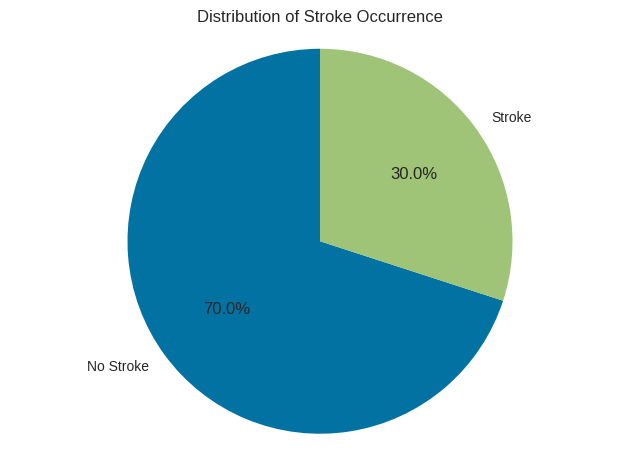

In [ ]:
# Count the number of instances for each class
stroke_counts = balanced_sample['stroke'].value_counts()

# Create a pie chart
plt.pie(stroke_counts, labels=['No Stroke', 'Stroke'], autopct='%1.1f%%', startangle=90)
plt.title('Distribution of Stroke Occurrence')
plt.axis('equal')  # Equal aspect ratio ensures that pie is drawn as a circle.
plt.show()

Correlation Matrix:
                      gender       age  hypertension  heart_disease  \
gender             1.000000  0.002629      0.011880      -0.115408   
age                0.002629  1.000000      0.330290       0.260164   
hypertension       0.011880  0.330290      1.000000       0.023645   
heart_disease     -0.115408  0.260164      0.023645       1.000000   
ever_married      -0.012102 -0.628550     -0.160996      -0.115726   
work_type         -0.022145 -0.409925     -0.092953      -0.078392   
Residence_type     0.004410 -0.005052      0.038189      -0.015049   
avg_glucose_level -0.186878  0.282092      0.204683       0.265516   
bmi               -0.003955  0.315365      0.184914       0.094433   
smoking_status    -0.034437 -0.397395     -0.184038      -0.027198   
stroke            -0.049487  0.507668      0.282193       0.215648   

                   ever_married  work_type  Residence_type  avg_glucose_level  \
gender                -0.012102  -0.022145        0.00441

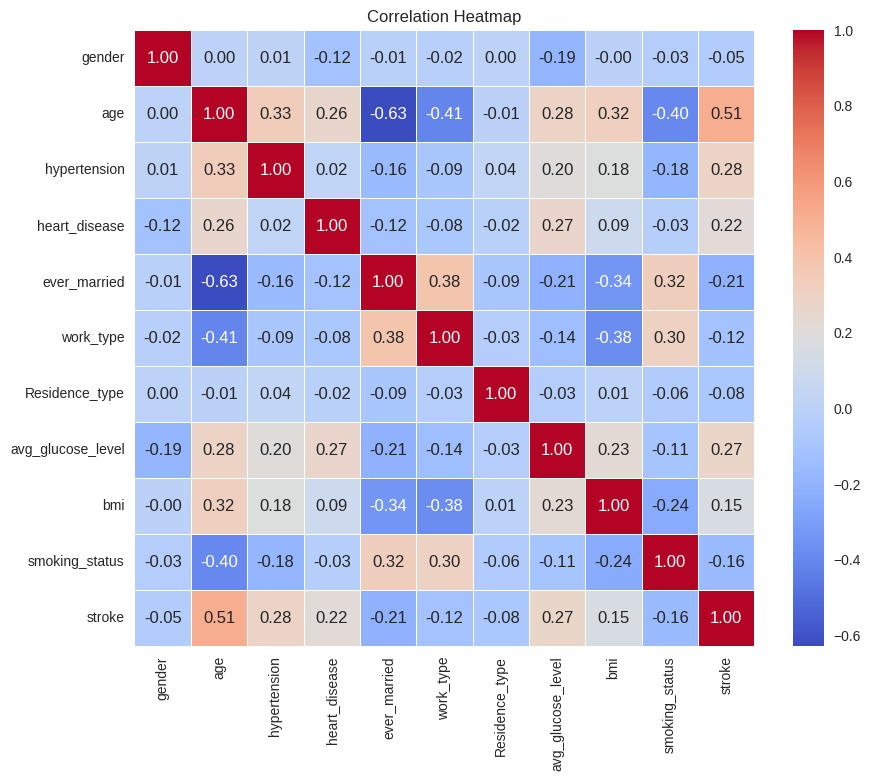

In [ ]:
# Ensure 'avg_glucose_level' and 'bmi' are numeric
balanced_sample['avg_glucose_level'] = pd.to_numeric(balanced_sample['avg_glucose_level'], errors='coerce')
balanced_sample['bmi'] = pd.to_numeric(balanced_sample['bmi'], errors='coerce')

# Calculate the correlation matrix for numeric columns
correlation_matrix = balanced_sample.corr()

# Print the correlation matrix
print("Correlation Matrix:\n", correlation_matrix)

# Create a heatmap of the correlation matrix
plt.figure(figsize=(10, 8))
sns.heatmap(correlation_matrix, annot=True, cmap="coolwarm", fmt=".2f", linewidths=0.5)

# Display the heatmap
plt.title("Correlation Heatmap")
plt.show()

#### Correlation meanings:
- values close to +1 has positive correlation (as one variable increases, the other increases in a perfectly linear fashion).
- values close to -1 has negative correlation (as one variable increases, the other decreases in a perfectly linear fashion).
- values =0: No correlation (the variables are independent or have no linear relationship).


#### Findings:
- "Age" has moderate positive correlation with stroke. As age increases, the risk of stroke tends to increase.
- "Heart Disease", "Hypertension", "Average Glucose Level" have weak positive correlation, which means indivisuals having heart deseases or hypertension or increase in average glucose level show slight increase in stroke risk.
- "Ever Married" has weak negative coorelation with stroke, which means that being married is linked to a slightly lower risk of stroke
- "BMI", "Smoking Status", "Residence Type", "Gender" have very weak correlation with stroke. they have minimal or no impact on stroke risk.

### Scatter Plot for Age and Average Glucose Level





 The scatter plot visualizes the relationship between age and avg_glucose_level. Each point represents an individual's average glucose level against their age. This visualization helps identify trends or patterns in the data, such as whether certain age groups tend to have higher or lower glucose levels. The plot provides a broad view of how glucose levels vary across different ages and can be used to detect clusters, trends, or any potential outliers in the dataset. Overall, it offers insights into how age may relate to glucose levels in the population.



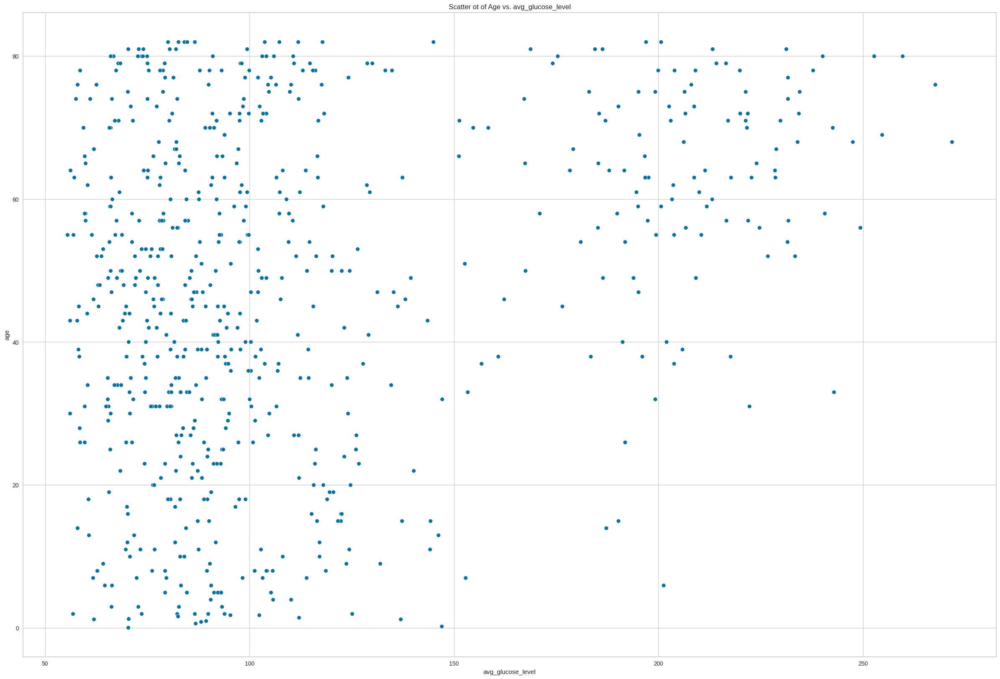

In [ ]:
plt.figure(figsize=(30,20))
sns.scatterplot(x='avg_glucose_level', y='age',data= balanced_sample)
plt.title( 'Scatter ot of Age vs. avg_glucose_level')
plt.xlabel('avg_glucose_level')
plt.ylabel('age')
plt.show()


 #### Findings:
The majority of individuals have an average glucose level within the range of 60 to 125. A significant portion of those with glucose levels exceeding 125 are older adults, typically aged 50 and above.

### Histogram

Histogram for BMI
The histogram displays the distribution of bmi values across the dataset. It divides the bmi range into bins, with each bar representing the frequency of data points within that bin. This visualization provides insights into the concentration of BMI values,showing how they are spread among individuals. The shape of the histogram can reveal patterns, such as whether the BMI is mostly within a healthy range or skewed toward higher or lower values. This helps in understanding the general health profile of the population based on BMI.



<Axes: title={'center': 'BMI Distribution'}, ylabel='Frequency'>

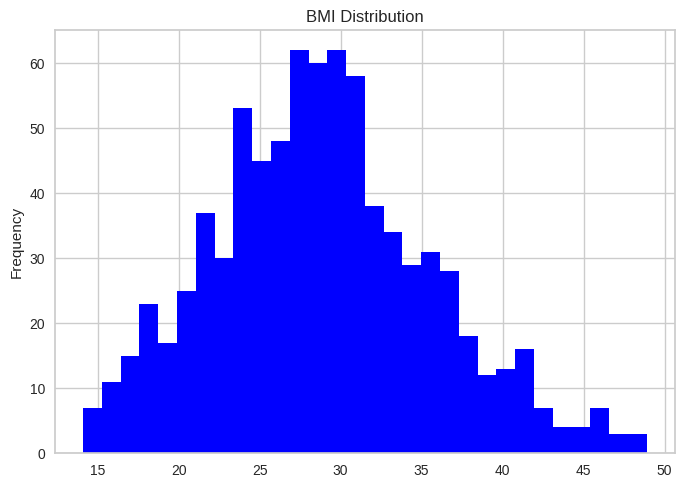

In [ ]:
balanced_sample['bmi'].plot.hist(bins=30, color='blue', title='BMI Distribution')

#### Findings:
The histogram shows that most individuals have a BMI between 25 and 35, indicating that the majority fall within the normal to overweight range. The peak BMI is around 25-30 which has the highest frequency with 60. There are relatively few cases of underweight (BMI below 20) or extreme obesity (BMI above 40), suggesting that outliers on both ends are rare.

### Box plot:
The box plot is a standardized  way of displaying the distribution of data based on a five number summary

<function matplotlib.pyplot.show(close=None, block=None)>

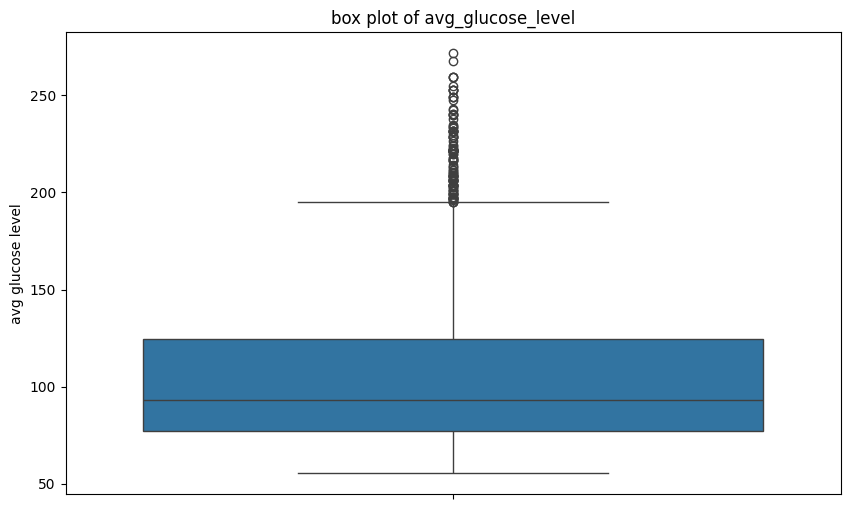

In [ ]:
plt.figure(figsize=(10, 6))
sns.boxplot(y=balanced_sample['avg_glucose_level'])
plt.title('box plot of avg_glucose_level')
plt.ylabel('avg glucose level')
plt.show

As we see the attribute avg glucose level has a wide range of data with a median of 90 and outliers in the range 180-260

<function matplotlib.pyplot.show(close=None, block=None)>

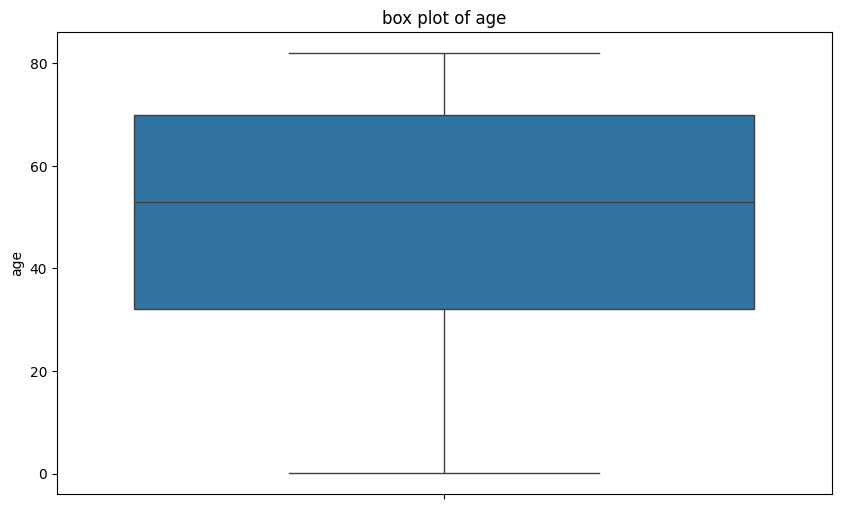

In [ ]:
plt.figure(figsize=(10, 6))
sns.boxplot(y=balanced_sample['age'])
plt.title('box plot of age')
plt.ylabel('age')
plt.show

The box plot of age is a standardized way of displaying the distribution of data based on a five number summary, as we see the attribute age has a wide range of data with a median of 52 and no outliers

<function matplotlib.pyplot.show(close=None, block=None)>

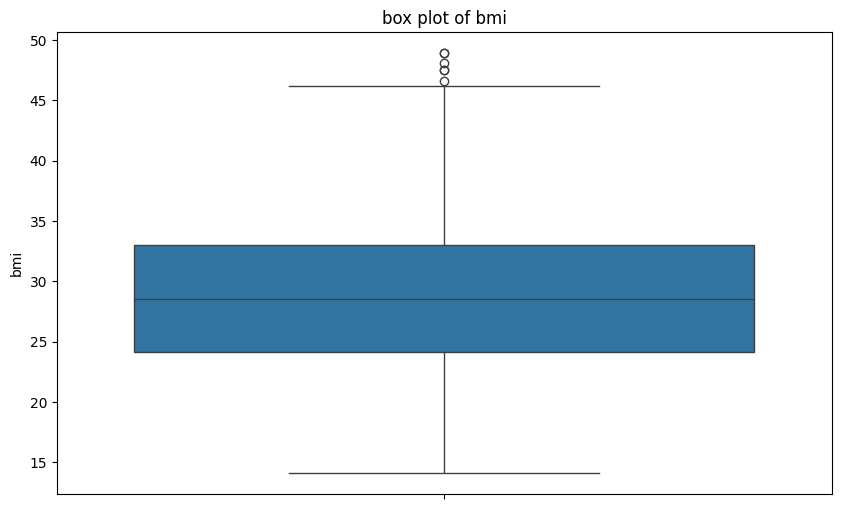

In [ ]:
plt.figure(figsize=(10, 6))
sns.boxplot(y=balanced_sample['bmi'])
plt.title('box plot of bmi')
plt.ylabel('bmi')
plt.show

The box plot is a standardized way of displaying the distribution of data based on a five number summary, as we see the attribute BMI has a wide range of data with a median of 28 which indicates that more than 50% of the sample are obese, and there is some outliers between 45-50

### Counting null values:
As showing, there is no null values in out dataset.

In [ ]:
print("Missing values in each column:")
print(balanced_sample.isnull().sum())

Missing values in each column:
gender               0
age                  0
hypertension         0
heart_disease        0
ever_married         0
work_type            0
Residence_type       0
avg_glucose_level    0
bmi                  0
smoking_status       0
stroke               0
dtype: int64


## **4.Data Processing:**
### Encoding:
The columns that needed to be transformed were the nominal ones. Since attributes like "work_type" and "smoking status" were already transformed from nominal to integer values, we didn't need to perform this step as part of our data preparation process.
### Duplicates:
As shown downbelow our dataset contained 129 duplicates, we removed all redundant records from our dataset by dropping them.

In [ ]:
num_duplicates = balanced_sample.duplicated().sum()
print("Number of duplicate rows:", num_duplicates)

Number of duplicate rows: 129


Since our dataset doesn't have a specific column for patient identification, such as a Patient ID or Social Insurance Number (SIN), we cannot assume that any rows are duplicated, as similar symptoms could appear for multiple cases. Therefore, we have not removed any duplicates.

### Outliers:
We identified outliers in our data by separately calculating them for each attribute type (binary, nominal, numeric), we calculated the outliers of the binaries and nominal integers to ensure that there is no mis entering values out of range, and to avoid mistakenly considering values as outliers based on comparison to the entire dataset. Once we identified these outliers, we took appropriate measures to handle them.

In [ ]:
# Specify the columns of interest
columns_of_interest = ['hypertension', 'avg_glucose_level', 'bmi']

# Count outliers in the specified columns
outlier_counts = {}
total_rows_with_outliers = 0

for column in columns_of_interest:
    outlier_threshold = 1.5
    q1 = np.percentile(balanced_sample[column], 25)
    q3 = np.percentile(balanced_sample[column], 75)
    iqr = q3 - q1
    upper_bound = q3 + outlier_threshold * iqr
    lower_bound = q1 - outlier_threshold * iqr
    outliers = (balanced_sample[column] > upper_bound) | (balanced_sample[column] < lower_bound)
    outlier_counts[column] = sum(outliers)
    total_rows_with_outliers += sum(outliers)

# Print the results
print("Outlier Counts:")
for column, count in outlier_counts.items():
    print(f"{column}: {count} rows with outliers")

print(f"Total Rows with Outliers: {total_rows_with_outliers}")

Outlier Counts:
hypertension: 132 rows with outliers
avg_glucose_level: 114 rows with outliers
bmi: 6 rows with outliers
Total Rows with Outliers: 252


### Handling outliers:
After analyzing outliers for numeric values we found that our numeric attributes contains exactly 252 outlier value overall, 132 raw of them from hypertension, 114 from the average glucose level, and 6 of them from the BMI column. Since the rows are a lot we preferred not to drop the raw, and other than that we handled the outliers by smoothing them using the capping out process(Winsorization), we preferred it most because it reduce the value to the nearest minimum/ maximum value that is not outliered.

And to ensure that there is no outliers and all outliers were handled we recounted the outliers

In [209]:
# Specify the columns of interest
columns_of_interest = ['hypertension', 'avg_glucose_level', 'bmi']

# Count outliers in the specified columns and handle them using capping
outlier_counts = {}

for column in columns_of_interest:
    outlier_threshold = 1.5
    q1 = np.percentile(balanced_sample[column], 25)
    q3 = np.percentile(balanced_sample[column], 75)
    iqr = q3 - q1
    upper_bound = q3 + outlier_threshold * iqr
    lower_bound = q1 - outlier_threshold * iqr

    # Find the outliers
    outliers = (balanced_sample[column] > upper_bound) | (balanced_sample[column] < lower_bound)
    outlier_counts[column] = sum(outliers)

    # Cap the outliers at the upper and lower bounds
    balanced_sample.loc[balanced_sample[column] > upper_bound, column] = upper_bound
    balanced_sample.loc[balanced_sample[column] < lower_bound, column] = lower_bound

# Print the results
print("Outlier Counts:")
for column, count in outlier_counts.items():
    print(f"{column}: {count} rows with outliers")

# Save the dataset after capping outliers
balanced_sample.to_csv('postCleaning_dataset.csv', index=False)

Outlier Counts:
hypertension: 0 rows with outliers
avg_glucose_level: 0 rows with outliers
bmi: 0 rows with outliers


To ensure there is no miss-entry we counted the outliers for other data types

In [ ]:
# Specify the columns of nominal
columns_of_interest = ['work_type', 'smoking_status']

# Dictionary to store any rows with mis-entries
mis_entries = {}

for column in columns_of_interest:
    # Find entries that are not 0 or 1
    invalid_entries = balanced_sample[~balanced_sample[column].isin([0, 1, 2, 3])]

    # If there are any invalid entries, store them
    if len(invalid_entries) > 0:
        mis_entries[column] = invalid_entries

    # Print the result
    print(f"{column}: {len(invalid_entries)} mis-entries found")

# If needed, you can also display the rows with mis-entries
for column, entries in mis_entries.items():
    print(f"\nInvalid entries in '{column}':")
    print(entries)

work_type: 0 mis-entries found
smoking_status: 0 mis-entries found


In [ ]:
# Specify the columns of interest (binary columns expected)
columns_of_interest = ['stroke', 'gender', 'heart_disease', 'ever_married', 'Residence_type']

# Dictionary to store any rows with mis-entries
mis_entries = {}

for column in columns_of_interest:
    # Find entries that are not 0 or 1
    invalid_entries = balanced_sample[~balanced_sample[column].isin([0, 1])]

    # If there are any invalid entries, store them
    if len(invalid_entries) > 0:
        mis_entries[column] = invalid_entries

    # Print the result
    print(f"{column}: {len(invalid_entries)} mis-entries found")

# If needed, you can also display the rows with mis-entries
for column, entries in mis_entries.items():
    print(f"\nInvalid entries in '{column}':")
    print(entries)

stroke: 0 mis-entries found
gender: 0 mis-entries found
heart_disease: 0 mis-entries found
ever_married: 0 mis-entries found
Residence_type: 0 mis-entries found


### Transformation:
After cleaning data and handling the outliers, we proceeded to perform the remaining transformation steps, including normalization and discretization.

### Normalization:
We preformed the normalization process to the attributes having continous value to be in shorter limited range (between 0 and 1) rather than large numbers.

In [ ]:
cd= pd.read_csv('postCleaning_dataset.csv')

#determine the columns to normalize
cols=['avg_glucose_level','bmi']

# Normalize the BMI column using Min-Max scaling
for col in cols:
    scaler = MinMaxScaler()
    cd[cols] = scaler.fit_transform(cd[cols])

#Printing output after normalizing
print("Output after Max/Min Scaling Normalization:\n")
print(pd.DataFrame(cd))

# Save the updated DataFrame
cd.to_csv('postnormalize_dataset.csv', index=False)

Output after Max/Min Scaling Normalization:

     gender   age  hypertension  heart_disease  ever_married  work_type  \
0         0  80.0             0              0             0          0   
1         1  55.0             0              1             0          0   
2         0  79.0             0              1             0          0   
3         0  75.0             0              0             0          0   
4         0  82.0             0              0             0          2   
..      ...   ...           ...            ...           ...        ...   
795       0  32.0             0              0             0          0   
796       1  66.0             0              0             0          2   
797       0  47.0             0              0             0          0   
798       1   5.0             0              0             1          3   
799       0  20.0             0              0             1          0   

     Residence_type  avg_glucose_level       bmi  smok

### Descritization:
We applied discretization to the "age" attribute, as it is commonly divided into three categories based on typical medical classifications:

Child: [0, 17], Adult: [18, 64], Older Adult: [65, 100]

**the last partition upper limit is 100 beacaue the maximmum age in our dataset is 82.

In [ ]:
cd= pd.read_csv('postnormalize_dataset.csv')

# Define age bins and labels
bins = [0, 17, 64, 100]  # Age ranges: 0-17 for child, 18-64 for adults, 65+ for Older adults
labels = ['Child', 'Adult', 'Older Adult']

# Discretize the Age column
cd['age'] = pd.cut(cd['age'], bins=bins, labels=labels, right=True)

# Display some of updated DataFrame
print("Output after Age Descritization:\n")
print(pd.DataFrame(cd))

# save the updated DataFrame to a new CSV file
cd.to_csv('postDescritize_dataset.csv', index=False)

Output after Age Descritization:

     gender          age  hypertension  heart_disease  ever_married  \
0         0  Older Adult             0              0             0   
1         1        Adult             0              1             0   
2         0  Older Adult             0              1             0   
3         0  Older Adult             0              0             0   
4         0  Older Adult             0              0             0   
..      ...          ...           ...            ...           ...   
795       0        Adult             0              0             0   
796       1  Older Adult             0              0             0   
797       0        Adult             0              0             0   
798       1        Child             0              0             1   
799       0        Adult             0              0             1   

     work_type  Residence_type  avg_glucose_level       bmi  smoking_status  \
0            0               1    

### Feature Selection:

We opted for the filter selection method due to its computational efficiency and speed, making it ideal for our dataset. This approach allows us to quickly identify the top 5 most important features that are strongly correlated with the occurrence of strokes. By focusing on these high-correlation features, we can streamline the model building process while retaining the variables most likely to impact stroke prediction.

To prevent biased correlations, we removed the 'stroke' column before analyzing with other features, because it will always give the highest correlation.

and as shown, based on the selection process, the top 5 attributes selected with highest correlation are( age, hypertension, heart_disease, ever_married, and avg_glucose_level)

In [ ]:
# Calculate the correlation matrix
correlation_matrix = df.corr()

# Find the absolute correlations and mask the diagonal (self-correlations)
correlation_matrix_abs = correlation_matrix.abs()
np.fill_diagonal(correlation_matrix_abs.values, 0)

# Find the index of the maximum correlation
max_corr_value = correlation_matrix_abs.max().max()
max_corr_pair = correlation_matrix_abs.stack().idxmax()

# Print the highest correlation and the corresponding pair
print(f"The highest correlation is {max_corr_value:.4f} between {max_corr_pair}")

The highest correlation is 0.6771 between ('age', 'ever_married')


In [ ]:
# Separate features and target variable from the balanced_sample
X = balanced_sample.drop('stroke', axis=1)  # Features
y = balanced_sample['stroke']                 # Target variable

# Use SelectKBest with f_classif as the scoring function
k = 5
selector = SelectKBest(score_func=f_classif, k=k)
X_new = selector.fit_transform(X, y)

# Display the selected features
selected_features = X.columns[selector.get_support()]
print("Selected Features:", selected_features)

# save the updated DataFrame to a new CSV file
cd.to_csv('postPreProcessing.csv', index=False)

Selected Features: Index(['age', 'heart_disease', 'ever_married', 'avg_glucose_level',
       'smoking_status'],
      dtype='object')


/usr/local/lib/python3.10/dist-packages/sklearn/feature_selection/_univariate_selection.py:112: UserWarning: Features [2] are constant.
  warnings.warn("Features %s are constant." % constant_features_idx, UserWarning)
/usr/local/lib/python3.10/dist-packages/sklearn/feature_selection/_univariate_selection.py:113: RuntimeWarning: invalid value encountered in divide
  f = msb / msw


In [ ]:
from sklearn.model_selection import train_test_split
from sklearn.naive_bayes import GaussianNB
from sklearn import metrics
from sklearn.metrics import confusion_matrix, accuracy_score, recall_score, precision_score, ConfusionMatrixDisplay
import matplotlib.pyplot as plt
from sklearn import tree
from sklearn.tree import DecisionTreeClassifier, plot_tree
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_samples, silhouette_score
from sklearn.datasets import load_iris
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import make_pipeline
!pip install kneed
from kneed import KneeLocator
import pickle

## **5.Data Mining Technique:**

We utilized both supervised and unsupervised learning methods on our data through the use of classification and clustering techniques.

### Balancing dataset:
Since our dataset already meets the minimum balance percentage of 30% 70% after sampling in Phase 2, no further balancing was needed.

## Classification:

We employed a supervised learning approach to classify individuals as having a brain stroke or not. To achieve this, we divided our dataset into training and testing subsets. The model was then trained on the training subset and evaluated on the testing subset using metrics such as accuracy, sensitivity, specificity, and precision.

To visualize and interpret the decision-making process, we utilized a decision tree implemented using “scikit-learn” library in Python. We used the tree because it is easy to interpret and gives simplify presents the resultant decision, with each leaf node indicating whether an individual is likely to have a brain stroke based on their attributes, including gender, age, marital status, glucose level, heart disease history, hypertension, smoking status, BMI, residence, and work type.

To optimize the model's performance, we experimented with two attribute selection measures (Entropy and Gini Index) and three different data partitions (70/30, 80/20, and 60/40). By comparing the performance results across these combinations, we identified the optimal attribute selection measure and data partition for our specific dataset.



- Sensitivity: represents how many did we correctly identify of all the actual positive cases.


*A higher sensitivity indicates that the model is good at identifying positive cases.*

- Specificity: represents how many did we correctly identify of all the actual negative cases.


*A higher specificity indicates that the model is good at identifying negative cases.*

- Precision: represents how many were actually positive of all the cases predicted as positive.


*A higher precision indicates that when the model predicts a positive case, it is more likely to be correct.*

In [ ]:
# Load the dataset
cd = pd.read_csv('postPreProcessing.csv')

# Mapping age labels to encoded values
age_mapping = {'Child': 0, 'Adult': 1, 'Older Adult': 2}
cd['age'] = cd['age'].map(age_mapping)

# Re-define X and y after mapping
fn = cd.keys().tolist() [:-1]
X = cd[fn]
y = cd['stroke']

### - Information Gain (Entropy):

#### - Model Training and Testing:

In [ ]:
# split dataset into training set and test set
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=1)

# createdecision tree classifier object
clf1ent = DecisionTreeClassifier(criterion='entropy', random_state=1)

#Train decision tree classifier
clf1ent= clf1ent.fit(X_train, y_train)

# Make predictions
y_pred = clf1ent.predict(X_test)

# Compute Accuracy
print("Accuracy:",metrics.accuracy_score(y_test, y_pred) )

Accuracy: 0.825


In [ ]:
print (X_train.count(), X_test.count())

gender               560
age                  560
hypertension         560
heart_disease        560
ever_married         560
work_type            560
Residence_type       560
avg_glucose_level    560
bmi                  560
smoking_status       560
dtype: int64 gender               240
age                  240
hypertension         240
heart_disease        240
ever_married         240
work_type            240
Residence_type       240
avg_glucose_level    240
bmi                  240
smoking_status       240
dtype: int64


### - Model Evaluation:

#### Confusion Matrix:


[[145  22]
 [ 20  53]]


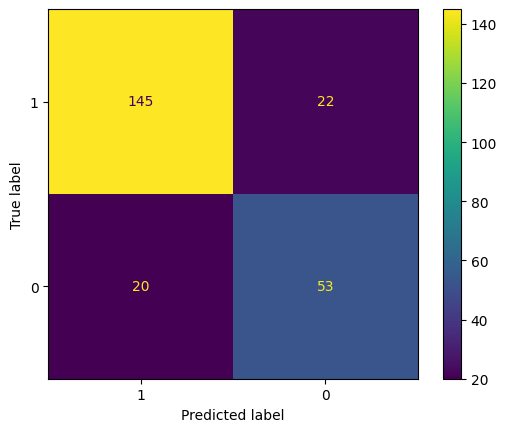

In [ ]:
cm1ent = confusion_matrix(y_test, y_pred)
print(cm1ent)

cn=cd['stroke'].unique() #classes_names

disp = ConfusionMatrixDisplay.from_estimator(clf1ent, X_test, y_test, display_labels=cn)

#### Findings:

- True Positives (TP) : This reflects the number of instances accurately identified as belonging to the positive class, and it equals 145 here.
- False Positives (FP) : This indicates the number of instances incorrectly classified as positive when they are actually negative, and it equals 22 here.


- True Negatives (TN) : This represents the number of instances accurately identified as belonging to the negative class, and it equals 53 here.
- False Negatives (FN) : This shows the number of instances incorrectly classified as negative when they are, in fact, positive, and equals 20 here.


<br>
*This classifier is having good accuracy, because most tuples are represented along the diagonal(TN + TP) of the confusion matrix.*

In [ ]:
# Sensitivity (Recall) and Specificity  require TN, FP, FN, TP :

TP = cm1ent[1, 1]
TN = cm1ent[0, 0]
FP = cm1ent[0, 1]
FN = cm1ent[1, 0]

# Sensitivity (Recall )
sensitivity = TP / (TP + FN)
print("Sensitivity:", sensitivity)

# Specificity
specificity = TN / (TN + FP)
print("Specificity:", specificity)

# Precision
precision = TP / (TP + FP)
print("Precision:", precision)

Sensitivity: 0.726027397260274
Specificity: 0.8682634730538922
Precision: 0.7066666666666667


#### Findings:

- Sensitivity: 0.72 - The model correctly identifies 72% of actual positive cases (strokes), missing 28%.

- Specificity: 0.86 - The model accurately detects 86% of actual negative cases (no strokes), with a 14% false positive rate.

- Precision: 0.70 - When predicting strokes, the model is correct 70% of the time, suggesting a need to reduce false positives.


<br>
*Overall, the model shows good specificity but moderate sensitivity and precision, highlighting opportunities for improvement to enhance detection and reduce misclassifications.*

#### - Visualizing and Saving Decision Trees:

In [ ]:
# Ensure class_names is a list of strings
class_names = [str(cls) for cls in y.unique()]

fig, ax = plt.subplots(figsize=(20, 20), dpi=400)

tree.plot_tree(clf1ent,
               feature_names=fn,
               class_names=class_names,
               filled=True)

plt.title("Decision Tree Classifier with Splitting Data into 70% for training and 30% Testing (Entropy)", fontsize=10, loc='center')  # Adjust title font size if needed
plt.show()
fig.savefig('Entropy3070DT.png')

The image illustrates a decision tree model for classification, using Entropy as the splitting criterion. The dataset is split into 70% for training and 30% for testing. The tree begins with “age” as the root node, which plays a critical role in the initial classification.

In this tree, the condition on the age node is evaluated as follows: if age <= 15, the condition is false, and the model proceeds to check the next node, “ever married”. This node splits the data further based on marital status, directing individuals along different paths depending on whether they are married or not.

However, if age > 15, the condition on the age node is true. In this case, the model moves to the next decision node, “BMI”, where the classification is further refined based on the individual’s body mass index.

After these initial decisions, the model continues branching down, using additional features in a specific order to make further splits at each level. These nodes might include attributes such as average glucose level, hypertension status, heart disease, work type, residence type, and smoking status. Each node along the path serves as a decision checkpoint, progressively narrowing down the classification.

Each path from the root to a leaf node represents a unique sequence of decisions, leading to a specific classification outcome at the end. With multiple levels and branches, the tree captures data complexity by focusing on essential features at each split to create increasingly homogeneous groups in each branch. This structured decision-making process results in terminal nodes (leaves) that consistently represent the predicted class for each subset, offering insight into how various features influence the classification.

The Entropy-based tree is generally simpler than the Gini-based tree, with fewer branches, making it more streamlined and interpretable.

#### Saving the model:

In [ ]:
clf1entfile= 'decisionTreeModel3070Entropy.sav'
pickle.dump(clf1ent, open(clf1entfile, 'wb'))

#### Using model for new predictions:

In [ ]:
# load model from the file
loaded_model = pickle.load(open(clf1entfile, 'rb'))
result = loaded_model.predict(X_test)
print(result)

# Generate new data (you can also use the previously generated 'new_values')
# Sample new data
new_values = pd.DataFrame({
    'gender': [1, 0, 0, 1, 1],
    'age': ['Older Adult', 'Older Adult', 'Adult', 'Adult', 'Adult'],  # Needs encoding
    'hypertension': [1, 0, 1, 1, 1],
    'heart_disease': [1, 0, 1, 0, 1],
    'ever_married': [1, 1, 0, 1, 1],
    'work_type': [2, 1, 0, 3, 2],
    'Residence_type': [0, 0, 1, 1, 1],
    'avg_glucose_level': [114.23, 114.83, 155.68, 123.99, 96.41],  # Needs scaling
    'bmi': [32.97, 31.51, 26.83, 23.85, 32.45],  # Needs scaling
    'smoking_status': [3, 1, 3, 2, 2]
})

# 1. Encode the 'age' column
age_mapping = {'Adult': 0, 'Older Adult': 1}  # Example encoding used in the model
new_values['age'] = new_values['age'].map(age_mapping)

# 2. Normalize continuous columns using MinMaxScaler
scaler = MinMaxScaler()  # Assuming Min-Max Scaling was used in training
new_values[['avg_glucose_level', 'bmi']] = scaler.fit_transform(new_values[['avg_glucose_level', 'bmi']])


# Make predictions with the model
predictions = loaded_model.predict(new_values)
print("Predictions for the new test dataset:", predictions)

[1 0 1 0 0 0 0 1 1 0 0 1 0 0 0 1 0 0 1 0 0 1 0 1 0 1 0 0 0 0 0 0 1 0 1 0 0
 0 0 0 0 1 0 1 0 0 0 0 1 0 0 0 0 0 0 0 0 1 0 1 0 0 1 0 1 0 0 0 0 0 1 0 0 0
 1 0 0 1 0 1 0 1 0 0 0 1 1 0 1 0 0 0 0 1 1 0 1 1 0 0 1 0 0 1 0 0 0 0 0 0 0
 0 1 0 1 0 1 1 0 1 0 1 0 0 0 0 0 0 0 0 0 0 0 1 0 1 1 0 1 0 1 0 1 0 0 0 1 0
 0 0 1 0 1 0 1 0 0 0 0 1 0 1 1 0 0 1 0 0 1 0 0 0 0 1 0 0 1 0 0 0 1 0 0 0 0
 1 0 0 0 1 0 0 0 0 0 0 0 0 1 1 1 0 0 1 0 0 0 1 1 1 0 1 1 1 1 0 1 0 0 1 0 0
 0 0 0 0 0 0 0 0 0 0 0 1 0 1 1 0 0 0]
Predictions for the new test dataset: [0 0 0 0 1]


Most samples were predicted as no stroke (0), except one sample predicted as stroke (1), the model failed with only 1 prediction.



---



### - Gini Index:

#### - Model Training and Testing:

In [ ]:
# split dataset into training set and test set
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=1)

# createdecision tree classifier object
clf1gini = DecisionTreeClassifier(criterion='gini', random_state=1)

#Train decision tree classifier
clf1gini= clf1gini.fit(X_train, y_train)

# Make predictions
y_pred = clf1gini.predict(X_test)

# Compute Accuracy
print("Accuracy:",metrics.accuracy_score(y_test, y_pred) )

Accuracy: 0.8041666666666667


### - Model Evaluation:

#### Confusion Matrix:


[[140  27]
 [ 20  53]]


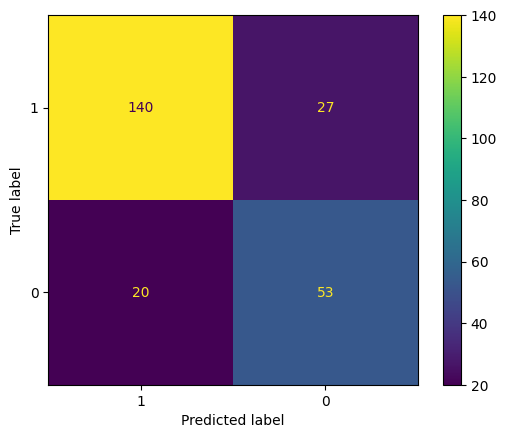

In [ ]:
cm1gini = confusion_matrix(y_test, y_pred)
print(cm1gini)

cn=cd['stroke'].unique() #classes_names

disp = ConfusionMatrixDisplay.from_estimator(clf1gini, X_test, y_test, display_labels=cn)

#### Findings:

- True Positives (TP) : This reflects the number of instances accurately identified as belonging to the positive class, and it equals 53 here.
- False Positives (FP) : This indicates the number of instances incorrectly classified as positive when they are actually negative, and it equals 27 here.


- True Negatives (TN) : This represents the number of instances accurately identified as belonging to the negative class, and it equals 140 here.
- False Negatives (FN) : This shows the number of instances incorrectly classified as negative when they are, in fact, positive, and it equals 20 here.


<br>
*This classifier is having good accuracy, because most tuples are represented along the diagonal(TN + TP) of the confusion matrix.*

In [ ]:
# Sensitivity (Recall) and Specificity  require TN, FP, FN, TP :

TP = cm1gini[1, 1]
TN = cm1gini[0, 0]
FP = cm1gini[0, 1]
FN = cm1gini[1, 0]

# Sensitivity (Recall )
sensitivity = TP / (TP + FN)
print("Sensitivity:", sensitivity)

# Specificity
specificity = TN / (TN + FP)
print("Specificity:", specificity)

# Precision
precision = TP / (TP + FP)
print("Precision:", precision)

Sensitivity: 0.726027397260274
Specificity: 0.8383233532934131
Precision: 0.6625


#### Findings:

- Sensitivity: 0.72 - The model correctly identifies 72% of actual positive cases (strokes), missing 28%.

- Specificity: 0.83 - The model accurately detects 83% of actual negative cases (no strokes), with a 17% false positive rate.

- Precision: 0.66 - When predicting strokes, the model is correct 66% of the time, suggesting a need to reduce false positives.


<br>
*Overall, the model shows good specificity but moderate sensitivity and precision, highlighting opportunities for improvement to enhance detection and reduce misclassifications.*

#### - Visualizing and Saving Decision Trees:

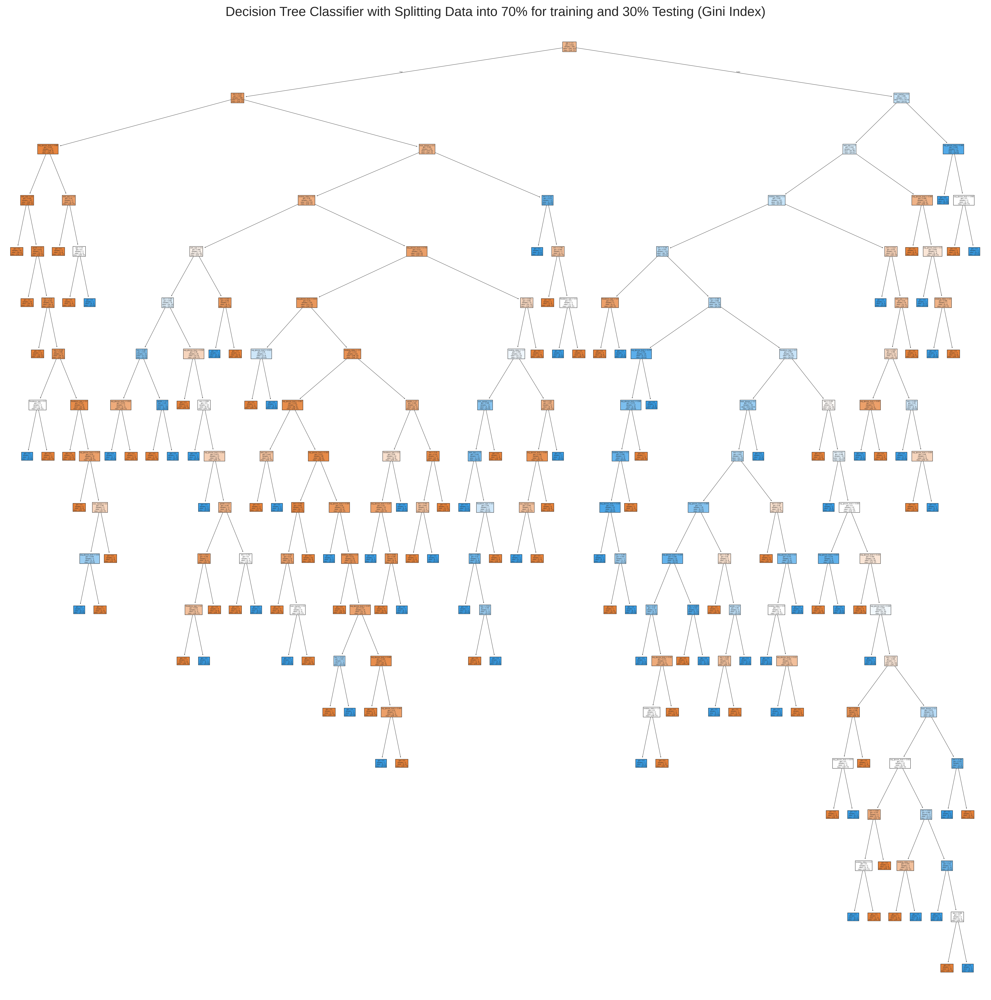

In [ ]:
# Ensure class_names is a list of strings
cm1gini = [str(name) for name in cm1gini]

fig, ax = plt.subplots(figsize=(20, 20), dpi=400)

tree.plot_tree(clf1gini,
               feature_names=fn,
               class_names=cm1gini,
               filled=True)

plt.title("Decision Tree Classifier with Splitting Data into 70% for training and 30% Testing (Gini Index)", fontsize=15, loc='center')
plt.show()
fig.savefig('Gini3070DT.png')

The image illustrates a decision tree model for classification, using the Gini Index as the splitting criterion. The dataset is split into 70% for training and 30% for testing. The tree begins with “age” as the root node, which plays a critical role in the initial classification.

In this tree, the condition on the age node is evaluated as follows: if age <= 15, the condition is false, and the model proceeds to check the next node, “ever married”. This node splits the data further based on marital status, directing individuals along different paths depending on whether they are married or not.

However, if age > 15, the condition on the age node is true. In this case, the model moves to the next decision node, “BMI”, where the classification is further refined based on the individual’s body mass index.

After these initial decisions, the model continues branching down, using additional features in a specific order to make further splits at each level. These nodes might include attributes such as average glucose level, hypertension status, heart disease, work type, residence type, and smoking status. Each node along the path serves as a decision checkpoint, progressively narrowing down the classification.

Each path from the root to a leaf node represents a unique sequence of decisions, leading to a specific classification outcome at the end. With multiple levels and branches, the tree captures data complexity by focusing on essential features at each split to create increasingly homogeneous groups in each branch. This structured decision-making process results in terminal nodes (leaves) that consistently represent the predicted class for each subset, offering insight into how various features influence the classification.

#### Saving the model:

In [ ]:
clf1ginifile= 'decisionTreeModel3070Entropy.sav'
pickle.dump(clf1gini, open(clf1ginifile, 'wb'))

#### Using model for new predictions:

In [ ]:
# load model from the file
loaded_model = pickle.load(open(clf1ginifile, 'rb'))
result = loaded_model.predict(X_test)
print(result)

# Generate new data (you can also use the previously generated 'new_values')
# Sample new data
new_values = pd.DataFrame({
    'gender': [1, 0, 0, 1, 1],
    'age': ['Older Adult', 'Older Adult', 'Adult', 'Adult', 'Adult'],  # Needs encoding
    'hypertension': [1, 0, 1, 1, 1],
    'heart_disease': [1, 0, 1, 0, 1],
    'ever_married': [1, 1, 0, 1, 1],
    'work_type': [2, 1, 0, 3, 2],
    'Residence_type': [0, 0, 1, 1, 1],
    'avg_glucose_level': [114.23, 114.83, 155.68, 123.99, 96.41],  # Needs scaling
    'bmi': [32.97, 31.51, 26.83, 23.85, 32.45],  # Needs scaling
    'smoking_status': [3, 1, 3, 2, 2]
})

# 1. Encode the 'age' column
age_mapping = {'Adult': 0, 'Older Adult': 1}  # Example encoding used in the model
new_values['age'] = new_values['age'].map(age_mapping)

# 2. Normalize continuous columns using MinMaxScaler
scaler = MinMaxScaler()  # Assuming Min-Max Scaling was used in training
new_values[['avg_glucose_level', 'bmi']] = scaler.fit_transform(new_values[['avg_glucose_level', 'bmi']])


# Make predictions with the model
predictions = loaded_model.predict(new_values)
print("Predictions for the new test dataset:", predictions)

[1 0 1 0 0 0 0 1 1 0 1 1 0 0 0 0 0 0 1 0 0 1 0 1 0 1 0 0 0 0 0 0 1 0 1 0 0
 0 0 0 0 1 0 1 0 0 1 0 1 0 0 0 0 0 0 0 0 1 0 1 0 0 1 0 1 0 0 0 0 0 1 0 0 0
 1 0 0 0 0 1 0 1 0 0 0 1 1 0 0 0 0 0 0 1 1 0 1 1 1 0 1 0 0 1 0 0 0 0 1 0 0
 0 1 0 1 0 1 1 0 0 0 1 0 0 0 0 1 0 0 0 0 0 0 1 0 1 1 0 1 0 1 0 1 0 0 0 1 1
 0 0 1 0 1 0 0 0 0 0 0 1 0 1 1 0 0 1 0 0 1 0 0 0 0 1 0 0 1 0 0 1 1 0 0 0 0
 1 0 0 1 1 0 0 0 0 0 0 0 0 1 1 1 0 0 1 0 0 0 1 0 1 0 1 1 1 1 1 1 0 0 1 0 0
 0 0 0 1 0 0 0 0 1 0 0 1 0 1 1 0 0 0]
Predictions for the new test dataset: [1 0 0 0 0]


Most samples were predicted as no stroke (0), except one sample predicted as stroke (1), showing the model is distinguishing between the classes.


---



### **Splitting data into 80% for Training and 20% for Testing:**

### - Information Gain (Entropy):

#### - Model Training and Testing:

In [ ]:
# split dataset into training set and test set
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=1)

# createdecision tree classifier object
clf2ent = DecisionTreeClassifier(criterion='entropy', random_state=1)

#Train decision tree classifier
clf2ent= clf2ent.fit(X_train, y_train)

# Make predictions
y_pred = clf2ent.predict(X_test)

# Compute Accuracy
print("Accuracy:",metrics.accuracy_score(y_test, y_pred) )

Accuracy: 0.8625


### - Model Evaluation:

#### Confusion Matrix:


[[102  14]
 [  8  36]]


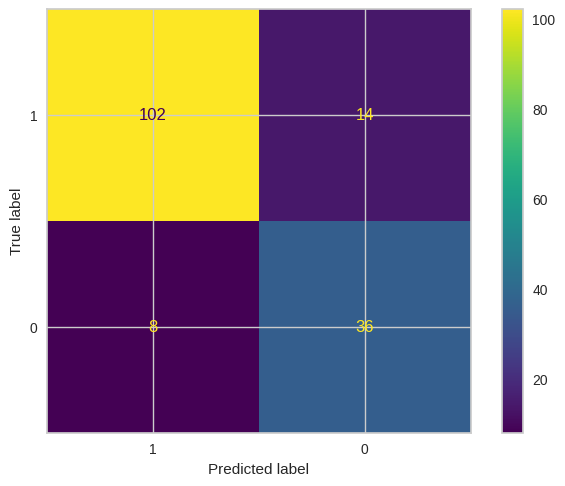

In [207]:
cm2ent = confusion_matrix(y_test, y_pred)
print(cm2ent)

cn=cd['stroke'].unique() #classes_names

disp = ConfusionMatrixDisplay.from_estimator(clf2ent, X_test, y_test, display_labels=cn)

#### Findings:

- True Positives (TP) : This reflects the number of instances accurately identified as belonging to the positive class, and it equals 102 here.
- False Positives (FP) : This indicates the number of instances incorrectly classified as positive when they are actually negative, and it equals 8 here.


- True Negatives (TN) : This represents the number of instances accurately identified as belonging to the negative class, and it equals 36 here.
- False Negatives (FN) : This shows the number of instances incorrectly classified as negative when they are, in fact, positive, and it equals 14 here.


<br>
*This classifier is having good accuracy, because most tuples are represented along the diagonal(TN + TP) of the confusion matrix.*

In [208]:
# Sensitivity (Recall) and Specificity  require TN, FP, FN, TP :

TP = cm2ent[1, 1]
TN = cm2ent[0, 0]
FP = cm2ent[0, 1]
FN = cm2ent[1, 0]

# Sensitivity (Recall )
sensitivity = TP / (TP + FN)
print("Sensitivity:", sensitivity)

# Specificity
specificity = TN / (TN + FP)
print("Specificity:", specificity)

# Precision
precision = TP / (TP + FP)
print("Precision:", precision)

Sensitivity: 0.8181818181818182
Specificity: 0.8793103448275862
Precision: 0.72


#### Findings:

- Sensitivity: 0.8 - The model correctly identifies 80% of actual positive cases (strokes), missing 32%.

- Specificity: 0.87 - The model accurately detects 87% of actual negative cases (no strokes), with a 22% false positive rate.

- Precision: 0.72 - When predicting strokes, the model is correct 72% of the time, suggesting a need to reduce false positives.


<br>
*Overall, the model shows good specificity but moderate sensitivity and precision, highlighting opportunities for improvement to enhance detection and reduce misclassifications.*

#### - Visualizing and Saving Decision Trees:

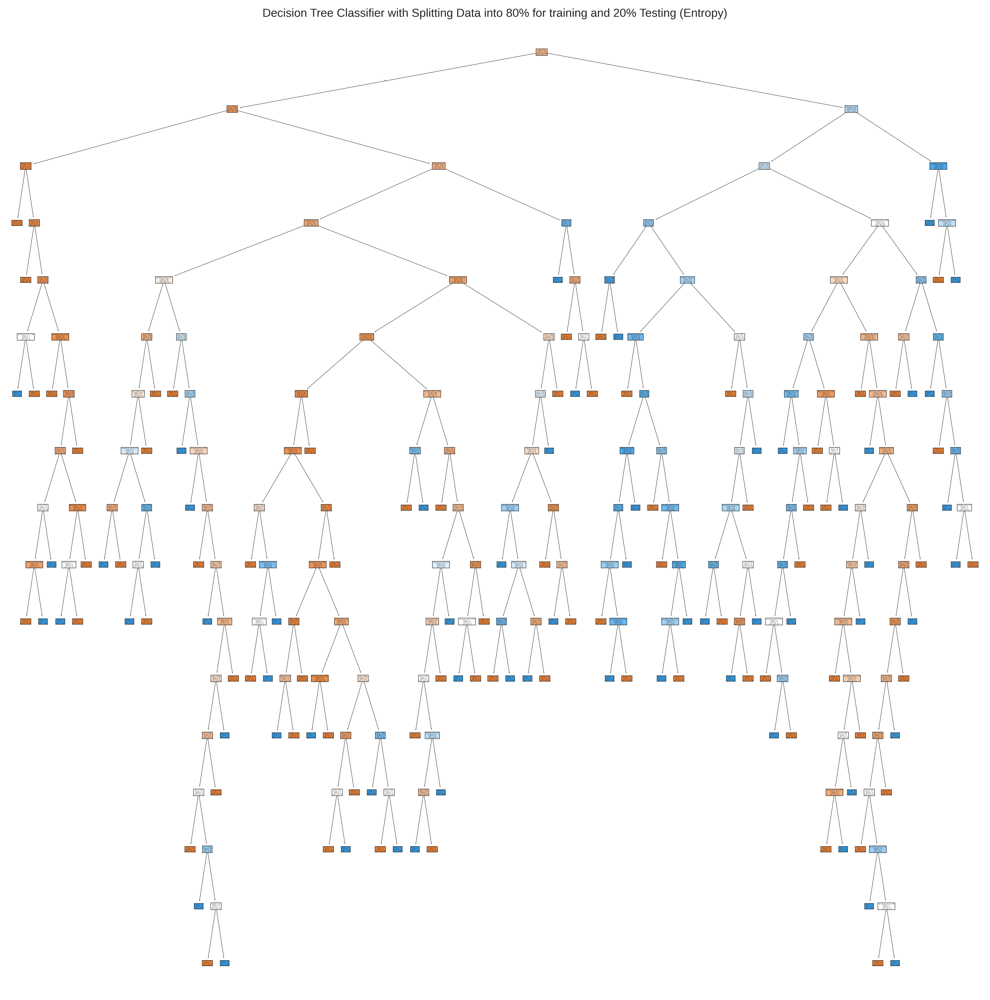

In [ ]:
# Ensure class_names is a list of strings
cm2ent = [str(name) for name in cm2ent]

fig, ax = plt.subplots(figsize=(15, 15), dpi=400)

tree.plot_tree(clf2ent,
               feature_names=fn,
               class_names=cm2ent,
               filled=True)

plt.title("Decision Tree Classifier with Splitting Data into 80% for training and 20% Testing (Entropy)", fontsize=10, loc='center')
plt.show()
fig.savefig('Entropy8020DT.png')

The decision tree model is predicting stroke cases primarily relies on **age** as the initial splitting criterion (root node), reflecting its strong correlation with stroke risk which give it the lowest entropy value. Subsequent splits are made based on attributes like BMI for non Older Adult individuals and Marrige status for Older Adults, followed by factors such as average glucose level, hypertension, heart disease, work type, residence type, and smoking status. These attributes are selected to maximize information gain at each node, leading to increasingly homogeneous subsets. The final leaves of the tree represent the predicted class (stroke or no stroke). The model's reliance on these attributes highlights their importance in determining stroke risk, and the tree's structure provides a visual representation of the decision-making process.

#### Saving the model:

In [ ]:
clf2entfile= 'decisionTreeModel2080Entropy.sav'
pickle.dump(clf2ent, open(clf2entfile, 'wb'))

#### Using model for new predictions:

In [ ]:
# load model from the file
loaded_model = pickle.load(open(clf2entfile, 'rb'))
result = loaded_model.predict(X_test)
print(result)

# Generate new data (you can also use the previously generated 'new_values')
# Sample new data
new_values = pd.DataFrame({
    'gender': [1, 0, 0, 1, 1],
    'age': ['Older Adult', 'Older Adult', 'Adult', 'Adult', 'Adult'],  # Needs encoding
    'hypertension': [1, 0, 1, 1, 1],
    'heart_disease': [1, 0, 1, 0, 1],
    'ever_married': [1, 1, 0, 1, 1],
    'work_type': [2, 1, 0, 3, 2],
    'Residence_type': [0, 0, 1, 1, 1],
    'avg_glucose_level': [114.23, 114.83, 155.68, 123.99, 96.41],  # Needs scaling
    'bmi': [32.97, 31.51, 26.83, 23.85, 32.45],  # Needs scaling
    'smoking_status': [3, 1, 3, 2, 2]
})

# 1. Encode the 'age' column
age_mapping = {'Adult': 0, 'Older Adult': 1}  # Example encoding used in the model
new_values['age'] = new_values['age'].map(age_mapping)

# 2. Normalize continuous columns using MinMaxScaler
scaler = MinMaxScaler()  # Assuming Min-Max Scaling was used in training
new_values[['avg_glucose_level', 'bmi']] = scaler.fit_transform(new_values[['avg_glucose_level', 'bmi']])


# Make predictions with the model
predictions = loaded_model.predict(new_values)
print("Predictions for the new test dataset:", predictions)

[1 0 1 0 0 0 0 1 1 0 0 1 0 0 0 0 0 0 1 0 0 1 0 1 0 1 0 0 0 1 0 0 1 0 1 1 0
 0 0 0 0 1 0 1 0 0 1 0 0 0 0 0 0 0 0 0 0 1 0 1 1 0 1 0 1 0 0 0 0 0 1 0 0 0
 1 0 0 1 0 1 0 0 0 0 0 1 1 0 1 0 0 0 0 0 1 0 1 1 0 0 1 0 0 0 0 0 0 0 1 0 0
 0 1 0 0 0 1 1 0 1 1 0 0 0 0 0 0 0 0 0 0 0 0 1 0 1 1 0 1 0 1 0 0 0 0 0 1 1
 0 0 1 0 1 0 1 0 0 1 0 1]
Predictions for the new test dataset: [0 0 0 0 0]


None sample predicted as stroke (1), all samples were predicted as no stroke (0). The model failed to predict stroke labeled values, the prediction shows that model is not distinguishing between the classes.



---



### - Gini Index:

In [ ]:
# Train-test split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=1)

# Train the Decision Tree Classifier with Gini index
clf2gini = DecisionTreeClassifier(criterion="gini", random_state=1)
clf2gini = clf2gini.fit(X_train, y_train)

# Make predictions
y_pred = clf2gini.predict(X_test)

# Compute Accuracy
print("Accuracy:", metrics.accuracy_score(y_test, y_pred))

Accuracy: 0.81875


### - Model Evaluation:

#### Confusion Matrix:


[[96 20]
 [ 9 35]]


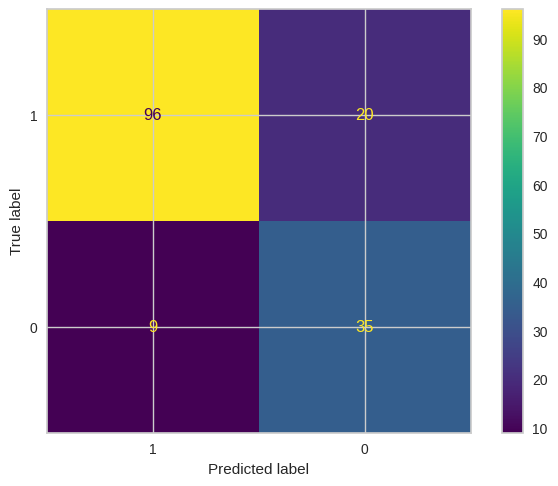

In [ ]:
cm2gini = confusion_matrix(y_test, y_pred)
print(cm2gini)

cn=cd['stroke'].unique() #classes_names

disp = ConfusionMatrixDisplay.from_estimator(clf2gini, X_test, y_test, display_labels=cn)

#### Findings:

- True Positives (TP) : This reflects the number of instances accurately identified as belonging to the positive class, and it equals 96 here.
- False Positives (FP) : This indicates the number of instances incorrectly classified as positive when they are actually negative, and it equals 9 here.


- True Negatives (TN) : This represents the number of instances accurately identified as belonging to the negative class, and it equals 20 here.
- False Negatives (FN) : This shows the number of instances incorrectly classified as negative when they are, in fact, positive, and it equals 35 here.


<br>
*This classifier is having good accuracy, because most tuples are represented along the diagonal(TN + TP) of the confusion matrix.*

In [ ]:
# Sensitivity (Recall) and Specificity  require TN, FP, FN, TP :

TP = cm2gini[1, 1]
TN = cm2gini[0, 0]
FP = cm2gini[0, 1]
FN = cm2gini[1, 0]

# Sensitivity (Recall )
sensitivity = TP / (TP + FN)
print("Sensitivity:", sensitivity)

# Specificity
specificity = TN / (TN + FP)
print("Specificity:", specificity)

# Precision
precision = TP / (TP + FP)
print("Precision:", precision)

Sensitivity: 0.7954545454545454
Specificity: 0.8275862068965517
Precision: 0.6363636363636364


#### Findings:

- Sensitivity: 0.80 - The model correctly identifies 80% of actual positive cases (strokes), missing 31.8%.

- Specificity: 0.82 - The model accurately detects 82% of actual negative cases (no strokes), with a 16.4% false positive rate.

- Precision: 0.63 - When predicting strokes, the model is correct 63% of the time, suggesting a need to reduce false positives.


<br>
*Overall, the model shows good specificity but moderate sensitivity and precision, highlighting opportunities for improvement to enhance detection and reduce misclassifications.*

#### - Visualizing and Saving Decision Trees:

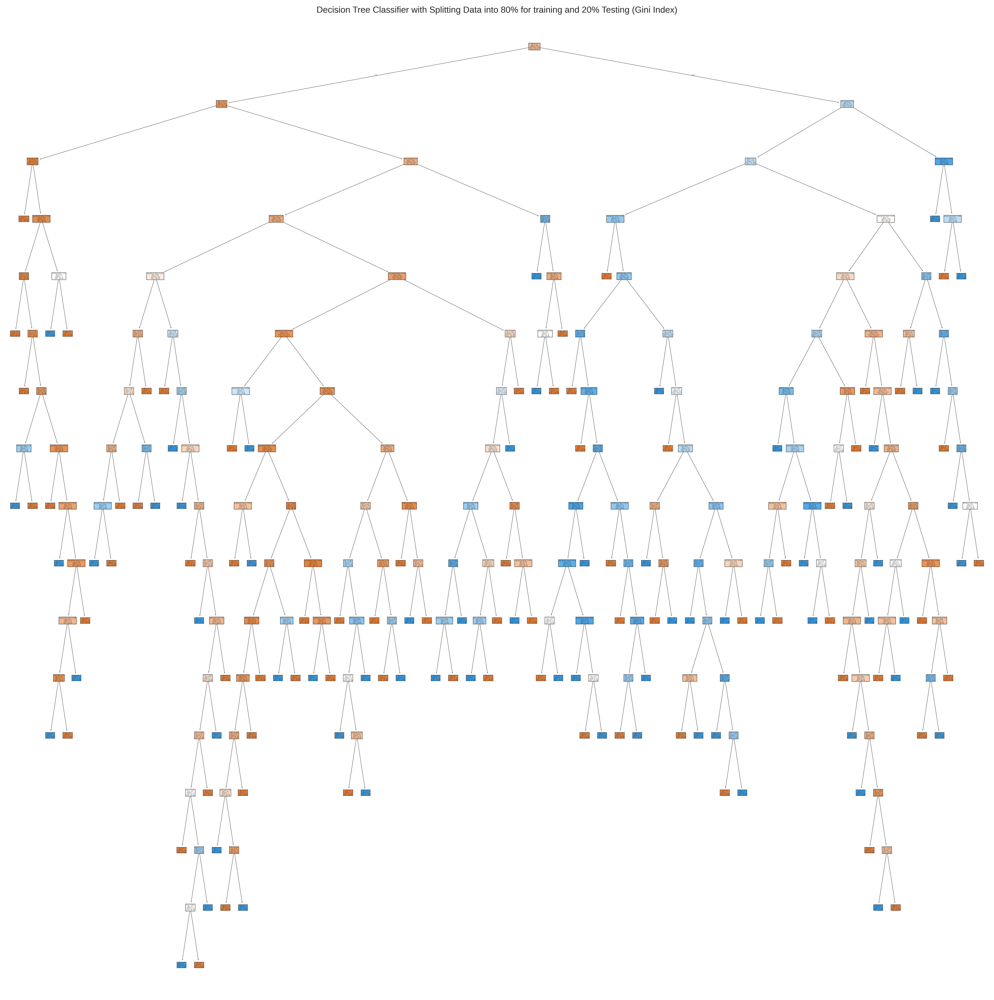

In [ ]:
# Ensure class_names is a list of strings
cm2gini = [str(name) for name in cm2gini]  # Convert class names to strings

fig, ax = plt.subplots(figsize=(20, 20), dpi=400)

tree.plot_tree(clf2gini,
               feature_names=fn,
               class_names=cm2gini,
               filled=True)

plt.title("Decision Tree Classifier with Splitting Data into 80% for training and 20% Testing (Gini Index)", fontsize=10,  loc='center')
plt.show()
fig.savefig('Gini2080DT.png')

The decision tree model is predicting stroke cases primarily relies on **age** as the initial splitting criterion (root node), reflecting its strong correlation with stroke risk which give it the lowest entropy value. Subsequent splits are made based on attributes like BMI for non Older Adult individuals and Marrige status for Older Adults, followed by factors such as average glucose level, hypertension, heart disease, work type, residence type, and smoking status. These attributes are selected to maximize information gain at each node, leading to increasingly homogeneous subsets. The final leaves of the tree represent the predicted class (stroke or no stroke). The model's reliance on these attributes highlights their importance in determining stroke risk, and the tree's structure provides a visual representation of the decision-making process.

the general splitting is apprixemitly as same as Entropy constructing, but this has less splittings in higher levels in the tree which is less than in the entropy, it produces a simpler tree structure compared to one using Entropy.

In contrast to the previous tree, which used entropy to maximize information gain and thus generated splits based on the highest reduction in uncertainty, this Gini-based tree focuses on minimizing class impurity. This difference leads to slight variations in the choice of attributes at each split, reflecting how the Gini index and entropy prioritize different aspects of the data. The final leaves of the tree represent the predicted class (stroke or no stroke), and the model’s structure visually encapsulates the step-by-step decision-making process. The reliance on specific attributes across both trees, despite the differing criteria, highlights their consistent importance in stroke prediction.

#### Saving the model:

In [ ]:
clf2ginifile= 'decisionTreeModel2080gini.sav'
pickle.dump(clf2gini, open(clf2ginifile, 'wb'))

#### Using model for new predictions:

In [ ]:
# load model from the file
loaded_model = pickle.load(open(clf2ginifile, 'rb'))
result = loaded_model.predict(X_test)
print(result)

# Generate new data (you can also use the previously generated 'new_values')
# Sample new data
new_values = pd.DataFrame({
    'gender': [1, 0, 0, 1, 1],
    'age': ['Older Adult', 'Older Adult', 'Adult', 'Adult', 'Adult'],  # Needs encoding
    'hypertension': [1, 0, 1, 1, 1],
    'heart_disease': [1, 0, 1, 0, 1],
    'ever_married': [1, 1, 0, 1, 1],
    'work_type': [2, 1, 0, 3, 2],
    'Residence_type': [0, 0, 1, 1, 1],
    'avg_glucose_level': [114.23, 114.83, 155.68, 123.99, 96.41],  # Needs scaling
    'bmi': [32.97, 31.51, 26.83, 23.85, 32.45],  # Needs scaling
    'smoking_status': [3, 1, 3, 2, 2]
})

# 1. Encode the 'age' column
age_mapping = {'Adult': 0, 'Older Adult': 1}  # Example encoding used in the model
new_values['age'] = new_values['age'].map(age_mapping)

# 2. Normalize continuous columns using MinMaxScaler
scaler = MinMaxScaler()  # Assuming Min-Max Scaling was used in training
new_values[['avg_glucose_level', 'bmi']] = scaler.fit_transform(new_values[['avg_glucose_level', 'bmi']])


# Make predictions with the model
predictions = loaded_model.predict(new_values)
print("Predictions for the new test dataset:", predictions)

[1 0 1 0 0 0 0 1 1 0 0 1 0 0 0 0 0 1 1 0 0 1 0 1 0 1 0 0 0 0 0 0 1 0 1 1 0
 0 0 0 0 1 0 1 0 0 1 0 0 0 0 0 0 0 0 0 0 1 0 1 1 0 1 0 1 0 0 0 0 0 1 0 1 0
 1 0 0 1 0 1 0 0 0 0 0 1 1 0 1 0 0 0 0 0 1 0 1 1 1 0 1 1 0 1 0 0 0 1 1 0 0
 0 1 0 0 0 1 1 0 1 1 0 0 0 0 0 0 0 0 0 0 0 0 1 0 1 1 0 1 0 1 0 1 0 0 0 1 1
 0 0 1 0 1 0 1 0 0 0 0 1]
Predictions for the new test dataset: [0 0 0 0 0]


None sample predicted as stroke (1), all samples were predicted as no stroke (0). The model failed to predict stroke labeled values, the prediction shows that model is not distinguishing between the classes.


---



### **Splitting Data into 60% for training and 40% Testing**

### - Information Gain (Entropy):

In [ ]:
# split dataset into training set and test set
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.4, random_state=1)

# createdecision tree classifier object
clf3ent = DecisionTreeClassifier(criterion='entropy', random_state=1)

#Train decision tree classifier
clf3ent= clf3ent.fit(X_train, y_train)

# Make predictions
y_pred = clf3ent.predict(X_test)

# Compute Accuracy

print("Accuracy:",metrics.accuracy_score(y_test, y_pred) )

Accuracy: 0.803125


### - Model Evaluation:

#### Confusion Matrix:

[[188  32]
 [ 31  69]]


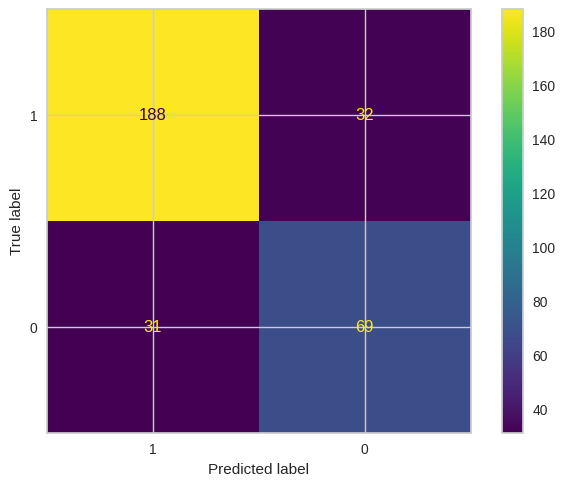

In [ ]:
#printing confussion matrix :
cm3ent = confusion_matrix(y_test, y_pred)
print(cm3ent)

cn=cd['stroke'].unique() #classes_names

# create confusion matrix display object
disp = ConfusionMatrixDisplay.from_estimator(clf3ent, X_test, y_test, display_labels=cn)

#### Findings:

- True Positives (TP) : This reflects the number of instances accurately identified as belonging to the positive class, and it equals 188  here.
- False Positives (FP) : This indicates the number of instances incorrectly classified as positive when they are actually negative, and it equals 31 here.


- True Negatives (TN) : This represents the number of instances accurately identified as belonging to the negative class, and it equals 69 here.
- False Negatives (FN) : This shows the number of instances incorrectly classified as negative when they are, in fact, positive, and it equals 32 here.


<br>
*This classifier is having good accuracy, because most tuples are represented along the diagonal(TN + TP) of the confusion matrix.*

In [ ]:
# Sensitivity (Recall) and Specificity  require TN, FP, FN, TP :

TP = cm3ent[1, 1]
TN = cm3ent[0, 0]
FP = cm3ent[0, 1]
FN = cm3ent[1, 0]

# Sensitivity (Recall )
sensitivity = TP / (TP + FN)
print("Sensitivity:", sensitivity)

# Specificity
specificity = TN / (TN + FP)
print("Specificity:", specificity)

# Precision
precision = TP / (TP + FP)
print("Precision:", precision)

Sensitivity: 0.69
Specificity: 0.8545454545454545
Precision: 0.6831683168316832


#### Findings:

- Error Rate: 0.206 - The model misclassifies about 20.6% of instances, means that model has good accuracy.

- Sensitivity: 0.69 - The model correctly identifies 69% of actual positive cases (strokes), missing 31%.

- Specificity: 0.854 - The model accurately detects 85.4% of actual negative cases (no strokes), with a 14.6% false positive rate.

- Precision: 0.69 - When predicting strokes, the model is correct 69% of the time, suggesting a need to reduce false positives.


<br>
*Overall, the model shows good specificity but moderate sensitivity and precision, highlighting opportunities for improvement to enhance detection and reduce misclassifications.*

#### - Visualizing and Saving Decision Trees:

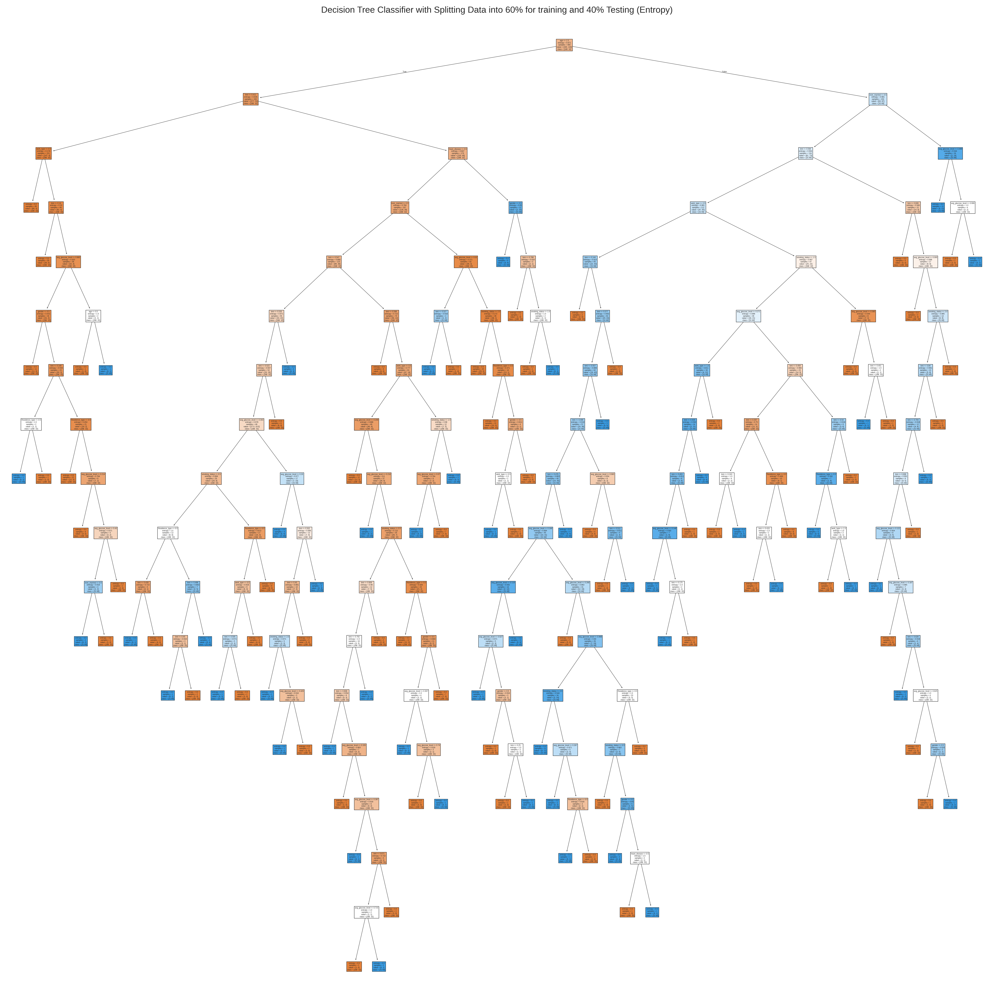

In [ ]:
# Ensure class_names is a list of strings
cm3ent = [str(name) for name in cm3ent]

fig, ax = plt.subplots(figsize=(20, 20), dpi=400)

tree.plot_tree(clf3ent,
               feature_names=fn,
               class_names=cm3ent,
               filled=True)

plt.title("Decision Tree Classifier with Splitting Data into 60% for training and 40% Testing (Entropy)", fontsize=10,  loc='center')
plt.show()
fig.savefig('Entropy4060DT.png')


The image depicts a decision tree model for classification, using The image depicts a decision tree model designed for classification, using Entropy as the criterion to determine splits. This method aims to maximize information gain at each decision point, allowing the model to effectively separate data into distinct classes. The dataset is divided into 60% for training and 40% for testing, enabling the model to learn from a majority of the data before evaluating its accuracy on unseen data. The decision tree begins with “age” as the root node, indicating that age is a highly influential feature in the initial stages of classification, and serves as a primary factor in distinguishing between different classes.

At the root node, the model evaluates the condition based on age, which creates the first split in the data. If the condition on the age node is met, the model proceeds to the left child node, where it further analyzes "BMI" (Body Mass Index) to refine the classification. This step indicates that BMI plays a significant role in further dividing the data and providing additional clarity for classification. On the other hand, if the age condition is not met, the model branches to the right child node, which evaluates the "ever married" feature. This node examines marital status as an important criterion to make further distinctions, allowing the model to segment individuals based on whether they have been married.

As the model extends down the tree, it applies additional conditions on features like glucose levels, hypertension, heart disease, work type, residence, and smoking status. Each feature progressively refines the classification, building from the broader initial split at the root to more specific groupings. For example, after age, BMI and marital status play key roles in defining further splits, emphasizing these features’ relevance to the classification process.

Each path from the root to a leaf node represents a unique sequence of decisions, ending in a classification outcome. This structured decision-making reflects the interaction of various features, capturing complex patterns while maintaining interpretability. Using entropy to guide splits maximizes information gain at each node, resulting in clearer, more homogenous groups that support accurate classification. Overall, the tree emphasizes the importance of age, BMI, and marital status, revealing how these factors influence the classification and contribute to the model’s predictive power.








#### Saving the model:

In [ ]:
clf3entfile= 'decisionTreeModel4060ent.sav'
pickle.dump(clf3ent, open(clf3entfile, 'wb'))

#### Using model for new predictions:

In [ ]:
# load model from the file
loaded_model = pickle.load(open(clf3entfile, 'rb'))
result = loaded_model.predict(X_test)
print(result)

# Generate new data (you can also use the previously generated 'new_values')
# Sample new data
new_values = pd.DataFrame({
    'gender': [1, 0, 0, 1, 1],
    'age': ['Older Adult', 'Older Adult', 'Adult', 'Adult', 'Adult'],  # Needs encoding
    'hypertension': [1, 0, 1, 1, 1],
    'heart_disease': [1, 0, 1, 0, 1],
    'ever_married': [1, 1, 0, 1, 1],
    'work_type': [2, 1, 0, 3, 2],
    'Residence_type': [0, 0, 1, 1, 1],
    'avg_glucose_level': [114.23, 114.83, 155.68, 123.99, 96.41],  # Needs scaling
    'bmi': [32.97, 31.51, 26.83, 23.85, 32.45],  # Needs scaling
    'smoking_status': [3, 1, 3, 2, 2]
})

# 1. Encode the 'age' column
age_mapping = {'Adult': 0, 'Older Adult': 1}  # Example encoding used in the model
new_values['age'] = new_values['age'].map(age_mapping)

# 2. Normalize continuous columns using MinMaxScaler
scaler = MinMaxScaler()  # Assuming Min-Max Scaling was used in training
new_values[['avg_glucose_level', 'bmi']] = scaler.fit_transform(new_values[['avg_glucose_level', 'bmi']])


# Make predictions with the model
predictions = loaded_model.predict(new_values)
print("Predictions for the new test dataset:", predictions)

[1 0 1 0 0 0 0 1 1 0 1 1 0 0 0 0 0 0 1 0 0 0 0 1 0 1 0 0 0 1 0 0 1 0 1 0 0
 0 0 0 0 1 0 1 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 1 0 1 0 0 0 0 0 1 0 0 0
 1 0 0 1 0 1 0 0 0 0 0 0 1 0 0 0 0 0 0 1 1 0 1 0 0 0 1 0 1 1 0 0 0 1 1 0 0
 0 1 0 0 0 1 1 1 0 0 1 0 0 0 1 1 0 0 0 0 0 1 1 0 1 1 0 1 0 1 0 0 0 0 0 0 1
 0 0 1 0 1 0 0 0 0 0 0 1 1 0 1 0 1 1 0 0 1 0 0 0 0 1 0 0 1 0 0 0 0 0 0 0 0
 1 0 0 1 1 0 0 0 0 0 0 0 0 1 1 1 0 0 0 0 0 0 1 1 1 0 1 1 1 1 1 1 0 0 1 0 0
 0 0 1 1 1 0 0 0 1 0 0 1 0 1 0 0 0 0 0 0 1 0 1 0 0 1 0 1 1 0 0 1 1 0 0 0 0
 0 1 0 1 0 0 0 0 0 0 0 0 0 0 1 1 0 1 0 1 0 1 0 0 0 0 0 1 0 0 0 0 0 0 1 1 0
 0 0 1 0 0 0 0 0 1 0 1 0 0 1 0 0 0 1 1 0 0 0 1 1]
Predictions for the new test dataset: [1 0 0 0 1]


Samples were predicted as no stroke (0) and as stroke (1), the model got all predictions correctly.



---



### - Gini Index:

In [ ]:
# Train-test split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.4, random_state=1)

# Train the Decision Tree Classifier with Gini index
clf3gini = DecisionTreeClassifier(criterion="gini", random_state=1)
clf3gini = clf3gini.fit(X_train, y_train)

# Make predictions
y_pred = clf3gini.predict(X_test)

# Compute Accuracy
print("Accuracy:", metrics.accuracy_score(y_test, y_pred))

Accuracy: 0.803125


#### Confusion Matrix:

[[185  35]
 [ 28  72]]


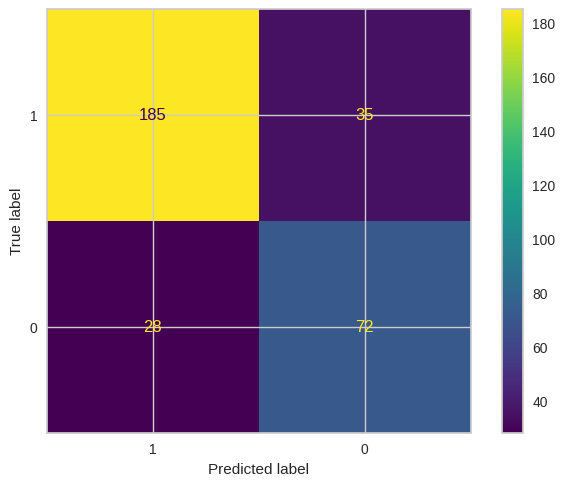

In [ ]:
#printing confussion matrix :
cm3gini = confusion_matrix(y_test, y_pred)
print(cm3gini)

cn=cd['stroke'].unique() #classes_names

# create confusion matrix display object
disp = ConfusionMatrixDisplay.from_estimator(clf3gini, X_test, y_test, display_labels=cn)

#### Findings:

- True Positives (TP) : This reflects the number of instances accurately identified as belonging to the positive class, and it equals 185 here.
- False Positives (FP) : This indicates the number of instances incorrectly classified as positive when they are actually negative, and it equals 28 here.


- True Negatives (TN) : This represents the number of instances accurately identified as belonging to the negative class, and it equals 72 here.
- False Negatives (FN) : This shows the number of instances incorrectly classified as negative when they are, in fact, positive, and it equals 35 here.


<br>
*This classifier is having good accuracy, because most tuples are represented along the diagonal(TN + TP) of the confusion matrix.*

In [ ]:
# Sensitivity (Recall) and Specificity  require TN, FP, FN, TP :

TP = cm3gini[1, 1]
TN = cm3gini[0, 0]
FP = cm3gini[0, 1]
FN = cm3gini[1, 0]

# Sensitivity (Recall )
sensitivity = TP / (TP + FN)
print("Sensitivity:", sensitivity)

# Specificity
specificity = TN / (TN + FP)
print("Specificity:", specificity)

# Precision
precision = TP / (TP + FP)
print("Precision:", precision)

Sensitivity: 0.72
Specificity: 0.8409090909090909
Precision: 0.6728971962616822


#### Findings:

- Error Rate: 0.20 - The model misclassifies about 20% of instances, means that model has good accuracy.

- Sensitivity: 0.72 - The model correctly identifies 72% of actual positive cases (strokes), missing 28%.

- Specificity: 0.8409 - The model accurately detects 84% of actual negative cases (no strokes), with a 16% false positive rate.

- Precision: 0.67 - When predicting strokes, the model is correct 67% of the time, suggesting a need to reduce false positives.


<br>
*Overall, the model shows good specificity but moderate sensitivity and precision, highlighting opportunities for improvement to enhance detection and reduce misclassifications.*

#### - Visualizing and Saving Decision Trees:

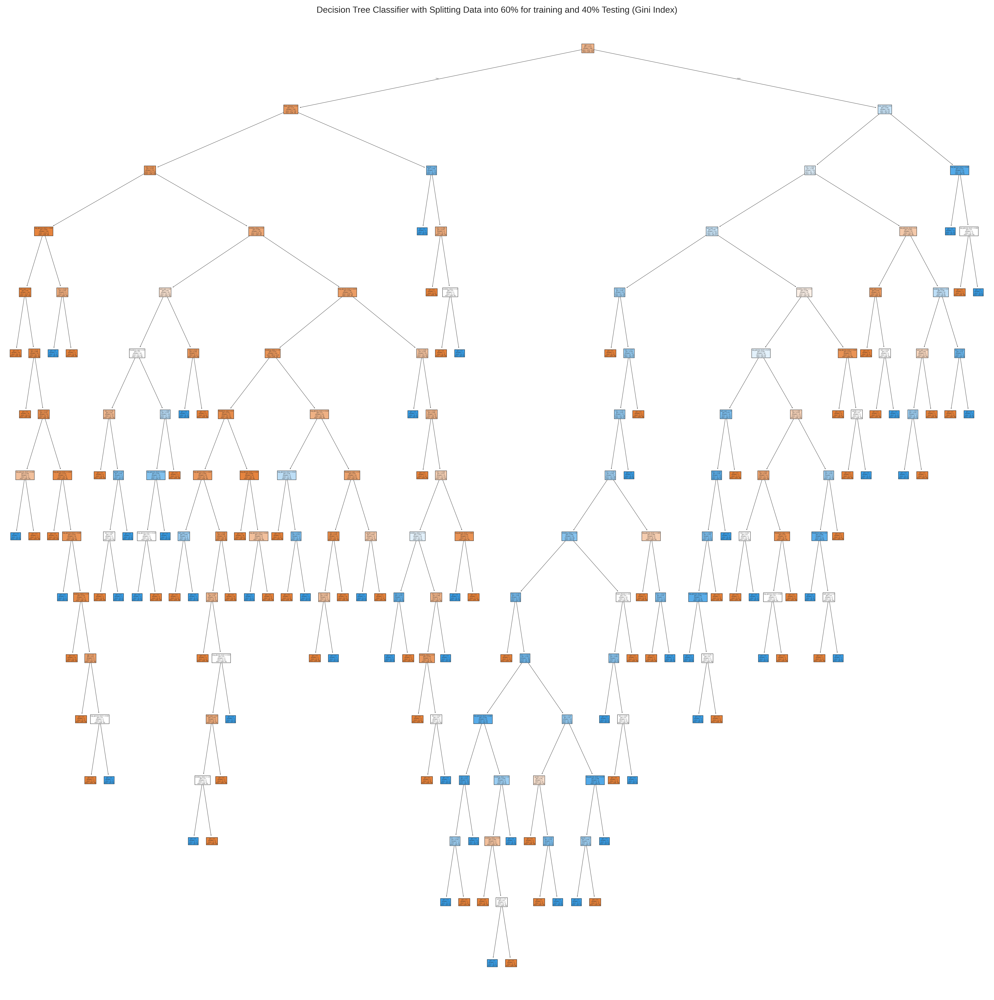

In [ ]:
# Ensure class_names is a list of strings
cm3gini = [str(name) for name in cm3gini]  # Convert class names to strings

fig, ax = plt.subplots(figsize=(20, 20), dpi=400)

tree.plot_tree(clf3gini,
               feature_names=fn,
               class_names=cm3gini,
               filled=True)

plt.title("Decision Tree Classifier with Splitting Data into 60% for training and 40% Testing (Gini Index)", fontsize=10,  loc='center')
plt.show()
fig.savefig('Gini4060DT.png')

The image shows a classification decision tree model that uses the Gini Index as its splitting criterion, with a 60% training and 40% testing data split. The tree starts with "age" as the root node, highlighting its significance in the classification process.

At the root, a condition on age initiates the first split. If this condition is true, the tree branches left to the "heart disease" node for further classification. If false, it branches right to evaluate "ever married," helping to separate classes based on marital status.

As the tree grows, additional features like BMI, glucose levels, hypertension, work type, residence type, and smoking status contribute to further splits at different levels. Each split refines the classification path, with branches grouping data based on feature values. Every path from the root to a leaf represents a distinct series of decisions that leads to a classification outcome.

Overall, this Gini-based decision tree effectively captures relationships among features, especially age, heart disease, and marital status. The Gini Index helps maximize the purity of each split, leading to more uniform groups within branches and supporting accurate classification.



#### Saving the model:

In [ ]:
clf3ginifile= 'decisionTreeModel4060gini.sav'
pickle.dump(clf3gini, open(clf3ginifile, 'wb'))

#### Using model for new predictions:

In [ ]:
# load model from the file
loaded_model = pickle.load(open(clf3ginifile, 'rb'))
result = loaded_model.predict(X_test)
print(result)

# Generate new data (you can also use the previously generated 'new_values')
# Sample new data
new_values = pd.DataFrame({
    'gender': [1, 0, 0, 1, 1],
    'age': ['Older Adult', 'Older Adult', 'Adult', 'Adult', 'Adult'],  # Needs encoding
    'hypertension': [1, 0, 1, 1, 1],
    'heart_disease': [1, 0, 1, 0, 1],
    'ever_married': [1, 1, 0, 1, 1],
    'work_type': [2, 1, 0, 3, 2],
    'Residence_type': [0, 0, 1, 1, 1],
    'avg_glucose_level': [114.23, 114.83, 155.68, 123.99, 96.41],  # Needs scaling
    'bmi': [32.97, 31.51, 26.83, 23.85, 32.45],  # Needs scaling
    'smoking_status': [3, 1, 3, 2, 2]
})

# 1. Encode the 'age' column
age_mapping = {'Adult': 0, 'Older Adult': 1}  # Example encoding used in the model
new_values['age'] = new_values['age'].map(age_mapping)

# 2. Normalize continuous columns using MinMaxScaler
scaler = MinMaxScaler()  # Assuming Min-Max Scaling was used in training
new_values[['avg_glucose_level', 'bmi']] = scaler.fit_transform(new_values[['avg_glucose_level', 'bmi']])


# Make predictions with the model
predictions = loaded_model.predict(new_values)
print("Predictions for the new test dataset:", predictions)

[1 0 1 0 0 0 0 1 1 0 0 1 0 0 0 1 0 1 1 0 0 1 0 1 0 1 0 0 0 1 0 0 0 0 1 0 0
 0 1 0 1 1 0 1 0 0 0 0 1 0 0 1 0 0 0 0 0 1 0 1 0 0 1 0 1 0 0 0 0 0 1 0 1 0
 1 0 0 0 0 1 0 0 0 0 0 0 1 0 0 0 0 0 0 1 1 0 1 0 0 0 1 0 0 0 0 1 0 1 1 1 0
 0 1 0 0 0 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 1 1 0 1 1 1 0 1 0 0 0 0 1
 0 0 1 1 1 0 1 0 0 1 0 1 0 0 1 0 1 1 0 0 1 0 0 0 0 1 0 0 1 0 0 0 0 0 0 1 0
 0 0 0 1 1 0 0 0 0 0 0 0 0 1 1 1 0 0 1 0 0 1 1 1 0 0 1 1 1 1 1 1 0 0 1 0 0
 0 0 0 1 0 1 0 0 1 0 0 1 0 1 0 0 0 0 1 0 1 0 0 0 0 1 0 0 0 0 0 1 0 0 1 0 0
 0 1 0 1 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 1 0 0 0 1 0 1 1 0 0 0 1 0 0 0 1 0 0
 1 0 1 0 0 0 1 0 1 0 1 0 0 1 0 1 0 1 1 0 0 0 1 1]
Predictions for the new test dataset: [1 0 1 0 1]


Most samples were predicted as no stroke (0), except one sample predicted as stroke (1), showing the model is distinguishing between the classes.
but since it predicted one extra stroke, then it mostly refer to low precision.



---



---



### Models Results Evaluation:
#### Information Gain (Entropy) Results:

| Metric       | 70% Training, 30% Testing | 80% Training, 20% Testing | 60% Training, 40% Testing |
|--------------|---------------------------|---------------------------|---------------------------|
| **Accuracy**    | 83%                     | 80%                     | 80%                     |
| **Sensitivity** | 72%                       | 80%                       | 69%                       |
| **Specificity** | 87%                       | 87%                       | 85%                       |
| **Precision**   | 70%                       | 72%                       | 68%                       |


based on the results provided, here’s a summary of findings for the model's performance across different training and testing splits:

- The highest accuracy is observed with the 70% training and 30% testing split at 83% while splits yield an accuracy of 80%.
<br>
This suggests that while a larger training set (80%) doesn’t notably improve accuracy, a balanced split of 70% may lead to marginally better model performance.

- Sensitivity (True Positive Rate) is highest with the 80% training split at 80%, and the 60% training split has the lowest sensitivity at 69%.
<br>
This indicates that the model’s ability to correctly identify positive cases improves slightly with a larger training set, though it decreases with a higher testing set (40%).

- Specificity (True Negative Rate) is stable across the 70% and 80% training splits at 87%.
It slightly decreases to 85% with the 60% training split, suggesting that the model’s ability to correctly identify negative cases remains consistent but slightly declines when there is a larger testing set.

- Precision is highest with the 80% training split at 72%.
The 70% training split yields 70%, and the 60% split yields the lowest precision at 68%.
<br>
This indicates that the model’s accuracy in predicting true positives, relative to all positive predictions, slightly improves with a larger training set.

<br>

**Overall Insights**:

**Best Split:** The 70% training, 30% testing split provides the highest accuracy (83%) and maintains good specificity (87%). However, if sensitivity (80%) and precision (72%) are more critical, the 80% training split performs slightly better in those metrics.

**Trade-offs:** Increasing the training set size tends to improve sensitivity and precision but has a minimal effect on accuracy and specificity. The 60% training split, with the largest test set, shows a minor decline across all metrics.

<br>
In summary, the 70% training and 30% testing split offers a balanced trade-off between accuracy and specificity, while the 80% training split improves the model's sensitivity and precision marginally.

### Gini Index Results:

| Metric       | 70% Training, 30% Testing | 80% Training, 20% Testing | 60% Training, 40% Testing |
|--------------|---------------------------|---------------------------|---------------------------|
| **Accuracy**    | 80%                     | 81%                     | 80%                     |
| **Sensitivity** | 72%                       | 79%                       | 72%                       |
| **Specificity** | 83%                       | 82%                       | 84%                       |
| **Precision**   | 66%                       | 63%                       | 67%                       |



Based on the results provided, here’s a summary of findings for the model’s performance across different training and testing splits:

 1. Highest Accuracy (80% Training, 20% Testing):
The highest accuracy is observed with the 80% training and 20% testing split at 81%, while the 70% training, 30% testing and 60% training, 40% testing splits both yield an accuracy of 80%.
 • This suggests that a larger training set (80%) slightly improves the accuracy to 81%, but the 70% training split also achieves similar performance with only a 1% difference.
 2. Sensitivity (True Positive Rate):
Sensitivity is highest with the 80% training split at 79%, while both the 70% training and 60% training splits yield lower sensitivities at 72%.
 • This indicates that the model’s ability to correctly identify positive cases improves with a larger training set, reaching its peak at 79% with the 80% training split.
 3. Specificity (True Negative Rate):
Specificity is highest with the 60% training, 40% testing split at 84%. It is slightly lower with the 70% training split at 83% and with the 80% training split at 82%.
 • This suggests that the model’s ability to correctly identify negative cases improves when there is a larger testing set, as shown in the 60% training, 40% testing split.
 4. Precision:
Precision is highest with the 60% training split at 67%. The 70% training split yields a precision of 66%, and the 80% training split results in the lowest precision at 63%.
 • This indicates that the model’s accuracy in predicting true positives, relative to all positive predictions, improves with a larger testing set, as shown in the 60% training, 40% testing split.

Overall Insights:
 • Best Split: The 70% training, 30% testing split offers a good balance across metrics, with an accuracy of 80% and high specificity at 83%. However, if maximizing sensitivity is important, the 80% training split performs best in that metric at 79%. The 60% training split is optimal if precision (67%) and specificity (84%) are the primary concerns.
 • Trade-offs: Increasing the training set size tends to improve sensitivity, but this is at the expense of precision and, in some cases, specificity. A smaller training set, like the 60% split, yields higher precision and specificity but slightly lowers sensitivity.

In summary, the 70% training and 30% testing split provides a balanced trade-off across accuracy, sensitivity, specificity, and precision, making it a strong choice for overall performance. Meanwhile, the 80% training split is ideal if sensitivity is prioritized, and the 60% split is preferable for maximizing specificity and precision.

# Comparing Gini Index And Information Gain results :




---
| Metric       | Best Result/ split (Information Gain) | Best Result/ split (Gini Index)
|--------------|--------------------------------|---------------------------|
| **Accuracy**    | 83% using (70% Train, 30% Test) split                           | 81% using (80% Train, 20% Test) split   |
| **Sensitivity** | 80% using (80% Train, 20% Test) split                        | 79% using (80% Train, 20% Test) split |
| **Specificity** | 87% using (70% Train, 30% Test)    | 84% using (60% Train, 40% Test) split |
| **Precision**   | 72% using (80% Train, 20% Test) | 67% using (60% Train, 40% Test) split   |



**1. Accuracy**

*  **Information Gain:** The highest accuracy (83%) is observed with the 70% Training, 30% Testing split, while other splits yield 80%.

*  **Gini Index:** The highest accuracy (81%) occurs with the 80% Training, 20% Testing split, and the other splits achieve 80%.

**Conclusion:** Information Gain demonstrates better performance on accuracy with a balanced split of 70% training, 30% testing, whereas Gini Index achieves a slight improvement in accuracy with an 80% training split.

 **2. Sensitivity (True Positive Rate)**

*   **Information Gain:** Highest sensitivity is observed with the 80% Training, 20% Testing split at 80%.
*  **Gini Index:**  The highest sensitivity is also observed with the 80% Training, 20% Testing split but slightly lower at 79%.

**Conclusion:** Information Gain has a marginally higher sensitivity with an 80% training split, suggesting it may be better at identifying positive cases in this setup.



**3. Specificity (True Negative Rate)**

*   **Information Gain:**Achieves high specificity (87%) with both 70% and 80% Training splits, with a slight drop to 85% with a 60% training split.
*  ** Gini Index:** The highest specificity (84%) is with the 60% Training, 40% Testing split, while other splits are slightly lower.

**Conclusion:** Information Gain maintains better specificity across splits, particularly in the 70% and 80% training splits, showing stability in identifying true negatives.

**4. Precision**

*   **Information Gain:**Precision is highest (72%) with the 80% Training, 20% Testing split.
*  ** Gini Index**:The highest precision (67%) occurs with the 60% Training, 40% Testing split.

Conclusion: Information Gain offers higher precision with the 80% training split, whereas Gini Index benefits from a larger testing set to increase precision.



**Overall Insights**



*  **Best Split for Information Gain:**  The 70% Training, 30% Testing split achieves the highest accuracy and stable specificity, offering a balanced trade-off.
*  **Best Split for Gini Index:** The 70% Training, 30% Testing split also provides a balanced approach, but if sensitivity is critical, the 80% Training, 20% Testing split performs better.




**Summary**
Information Gain is superior in overall accuracy, specificity, and precision, making it generally more effective across splits.
Gini Index provides competitive sensitivity and precision in certain configurations but slightly trails in accuracy and specificity.
If accuracy and specificity are the primary goals, Information Gain is preferable. However, Gini Index might be useful when focusing on sensitivity with a slightly larger training set.

Partition Size: 0.2, Criterion: entropy, Accuracy: 0.8625
Partition Size: 0.2, Criterion: gini, Accuracy: 0.81875
Partition Size: 0.3, Criterion: entropy, Accuracy: 0.825
Partition Size: 0.3, Criterion: gini, Accuracy: 0.8041666666666667
Partition Size: 0.4, Criterion: entropy, Accuracy: 0.803125
Partition Size: 0.4, Criterion: gini, Accuracy: 0.803125


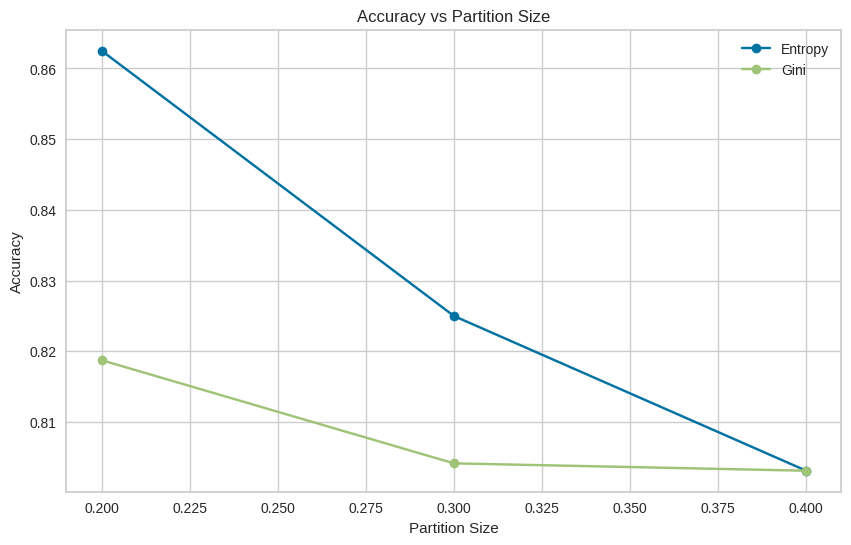

In [ ]:
partition_sizes = [0.2, 0.3, 0.4] #testing sizes in partitions

criterions = ["entropy", "gini"]

results = {}

for size in partition_sizes:
    for criterion in criterions:

        X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=size, random_state=1)

        clf = DecisionTreeClassifier(criterion=criterion, random_state=1)

        clf.fit(X_train, y_train)

        y_pred = clf.predict(X_test)

        accuracy = accuracy_score(y_test, y_pred)

        results[(size, criterion)] = accuracy

for (size, criterion), accuracy in results.items():
    print(f"Partition Size: {size}, Criterion: {criterion}, Accuracy: {accuracy}")

sizes_entropy = [size for size, criterion in results if criterion == "entropy"]
accuracies_entropy = [results[(size, "entropy")] for size in sizes_entropy]
sizes_gini = [size for size, criterion in results if criterion == "gini"]
accuracies_gini = [results[(size, "gini")] for size in sizes_gini]

plt.figure(figsize=(10, 6))
plt.plot(sizes_entropy, accuracies_entropy, marker='o', label='Entropy')
plt.plot(sizes_gini, accuracies_gini, marker='o', label='Gini')
plt.title('Accuracy vs Partition Size')
plt.xlabel('Partition Size')
plt.ylabel('Accuracy')
plt.legend()
plt.grid(True)
plt.show()

# **Clustering:**

We utilized an unsupervised learning approach, specifically the “K-means” clustering algorithm, to group similar data points. This algorithm iteratively assigns each data point to the nearest cluster centroid, refining the centroids with each iteration. We choose “K-means” because of its popularity and its effectiveness even with large datasets.

To implement “K-means”, we employed the “KMeans” class from the Python library “scikit-learn”. Given the unsupervised nature of clustering, we excluded the class label "stroke" and considered all other attributes in our dataset.

To evaluate the quality of the clusters, we computed the average silhouette score for each cluster. Additionally, we employed the Within-Cluster Sum of Squares (WSS) method to compare the sizes of the three clusters (2, 3, 7) and determine the optimal number of clusters, balancing cluster separation and compactness.


In [ ]:
# Load the preprocessed dataset
df = pd.read_csv("postPreProcessing.csv")

# Extract the features (excluding the target variable, if any)
features = df.drop('stroke', axis=1)

# Mapping age labels to encoded values
age_mapping = {'Child': 0, 'Adult': 1, 'Older Adult': 2}
features['age'] = features['age'].map(age_mapping)

# Use StandardScaler to scale the features
scaler = StandardScaler()
scaled_features = scaler.fit_transform(features)  # Create a new DataFrame with the scaled features

df_scaled = pd.DataFrame(scaled_features, columns=features.columns)

# Display the scaled DataFrame
print("\nScaled DataFrame:")
print(df_scaled.head())


Scaled DataFrame:
     gender       age  hypertension  heart_disease  ever_married  work_type  \
0 -1.133893  1.290851           0.0      -0.302333     -0.644926  -0.701885   
1  0.881917 -0.278573           0.0       3.307612     -0.644926  -0.701885   
2 -1.133893  1.290851           0.0       3.307612     -0.644926  -0.701885   
3 -1.133893  1.290851           0.0      -0.302333     -0.644926  -0.701885   
4 -1.133893  1.290851           0.0      -0.302333     -0.644926   1.211259   

   Residence_type  avg_glucose_level       bmi  smoking_status  
0        0.995012           1.900621  0.430379        0.449387  
1       -1.005013           1.900621  1.669633        0.449387  
2        0.995012           0.451779 -0.928320       -1.403756  
3       -1.005013           1.900621 -0.450536        0.449387  
4       -1.005013           1.900621  0.027249       -1.403756  


## K-means clustering:
K-means clustering is an unsupervised machine learning algorithm used to partition a dataset into K distinct clusters based on their similarities. It assigns each data point to the nearest cluster centroid and iteratively updates the centroids to minimize the within-cluster sum of squared distances.

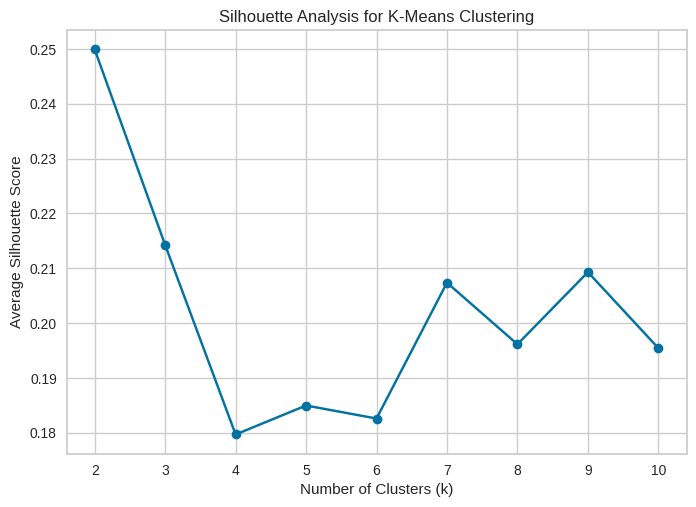

The highest average Silhouette score is 0.24990963538618502 with k=2.
The second highest average Silhouette score is 0.2142488093717586 with k=3.


In [ ]:
# Perform k-means clustering with different values of k
k_values = range(2, 11)
silhouette_avg_values = []

for k in k_values:
    kmeans = KMeans(n_clusters=k, random_state=42, n_init='auto')
    kmeans_result = kmeans.fit_predict(df_scaled)
    silhouette_avg = silhouette_score(df_scaled, kmeans_result)
    silhouette_avg_values.append(silhouette_avg)

# Find the best number of clusters based on the highest average Silhouette score
best_k = k_values[np.argmax(silhouette_avg_values)]
best_score = max(silhouette_avg_values)

# Find the second highest average Silhouette score and its corresponding number of clusters
silhouette_avg_values_sorted = sorted(silhouette_avg_values, reverse=True)
second_best_score = silhouette_avg_values_sorted[1]
second_best_k = k_values[silhouette_avg_values.index(second_best_score)]

# Plot the silhouette scores for different values of k
plt.plot(k_values, silhouette_avg_values, marker='o')
plt.title('Silhouette Analysis for K-Means Clustering')
plt.xlabel('Number of Clusters (k)')
plt.ylabel('Average Silhouette Score')
plt.show()

print(f"The highest average Silhouette score is {best_score} with k={best_k}.")
print(f"The second highest average Silhouette score is {second_best_score} with k={second_best_k}.")

as you can see above We found that the optimal number of clusters (k) maximizing the average Silhouette coefficient is 2, which will be our first k-means choice, and our second will be 3

## Elbow method:
The Elbow method is a technique used to determine the optimal number of clusters in a dataset for K-means clustering. It involves plotting the within-cluster sum of squares (inertia) as a function of the number of clusters. The inertia measures the compactness of the clusters, and the Elbow point represents the number of clusters where adding more clusters does not significantly reduce the inertia. The Elbow method helps in finding a balance between having a low inertia and avoiding overfitting.

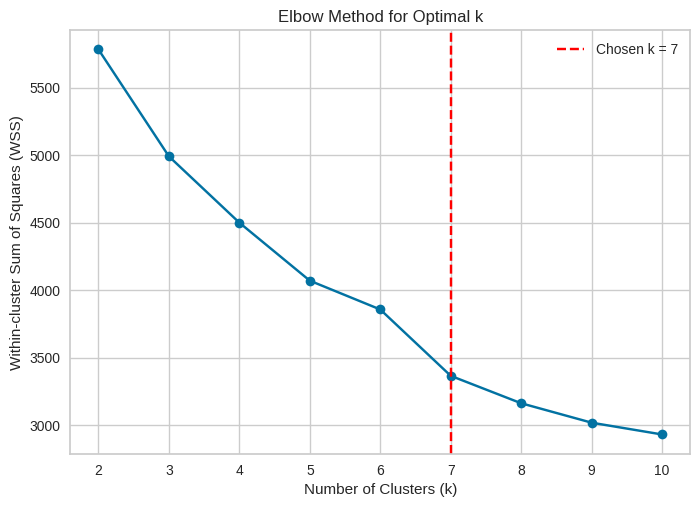

In [ ]:
wss_values = []
X_scaled = scaler.fit_transform(X)

for k in k_values:
    kmeans = KMeans(n_clusters=k, random_state=42, n_init='auto')
    kmeans.fit(X_scaled)
    wss_values.append(kmeans.inertia_)

plt.plot(k_values, wss_values, marker='o')
plt.xlabel('Number of Clusters (k)')
plt.ylabel('Within-cluster Sum of Squares (WSS)')
plt.title('Elbow Method for Optimal k')

knee = KneeLocator(k_values, wss_values, curve='convex', direction='decreasing')
turning_point = knee.elbow

plt.axvline(x=turning_point, linestyle='--', color='red', label=f'Chosen k = {turning_point}')
plt.legend()
plt.show()


turning point represents a different cluster configuration so k=7 will be our choice for the third k-means clustering. By considering this additional turning point, we aim to capture a diverse range of cluster formations and maximize the potential clustering performance.

## k-means clustering, visualization, and evaluation:
In this section, we will perform k-means clustering and visualize its result using three different k’s that have been chosen beforehand, then we will compute WSS and Bcubed preceision and recall and average silhouette for each cluster as methods of evaluating clustering results.

## **K=2**

In [ ]:
import numpy as np
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt

np.random.seed(8953)

# Perform K-means clustering for K=2
kmeans = KMeans(n_clusters=2, random_state=8953, n_init='auto')  # Set n_init explicitly and init='auto'
kmeans_result = kmeans.fit(df_scaled)

# Print the clustering result
print("Cluster Centers:")
print(kmeans_result.cluster_centers_)
print("\nCluster Labels:")
print(kmeans_result.labels_)

Cluster Centers:
[[ 0.00367375  0.35942639  0.          0.08157207 -0.54324772 -0.28020538
   0.03445155  0.13175709  0.2571005  -0.25150141]
 [-0.00987004 -0.96564786  0.         -0.21915444  1.45950886  0.75280984
  -0.09255876 -0.35398334 -0.69073545  0.67569272]]

Cluster Labels:
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 1 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0
 0 0 1 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 1 0 0 0 0
 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 1 0 1 0 0 0 0 0 1 0 0 0 0 0
 0 0 0 0 0 0 1 0 0 0 0 1 0 1 1 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0
 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 1 0 0 1 0 1 0 0 0 1 0 0 0 1 0 0 1 0
 0 0 0 1 0 1 0 1 1 1 0 1 1 0 0 0 1 1 1 0 0 1 0 1 0 1 1 0 0 0 0 0 0 0 0 0 0
 1 0 0 0 0 1 0 0 0 1 0 1 1 0 1 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 1 1 0 1 0 1 1
 0 0 0 0 0 0 0 0 1 1 1 0 0 0 0 0 0 1 0 0

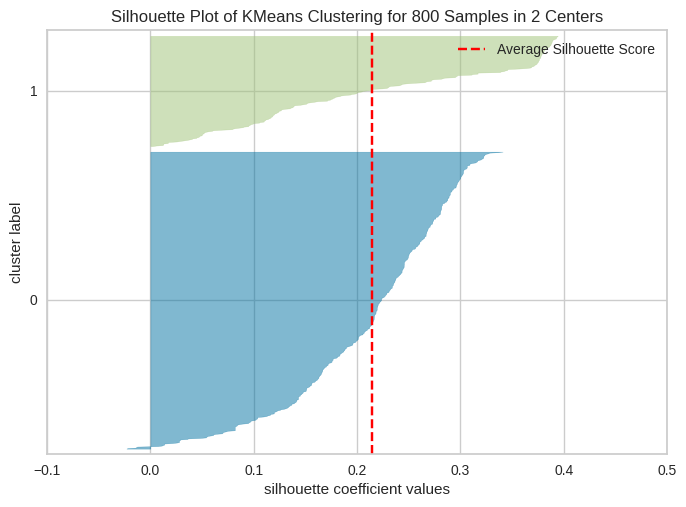

<Axes: title={'center': 'Silhouette Plot of KMeans Clustering for 800 Samples in 2 Centers'}, xlabel='silhouette coefficient values', ylabel='cluster label'>

In [ ]:
!pip install yellowbrick
from yellowbrick.cluster import SilhouetteVisualizer
from sklearn.cluster import KMeans

kmeans = KMeans(n_clusters=2,n_init='auto')
visualizer = SilhouetteVisualizer(kmeans, colors='yellowbrick')
visualizer.fit(df_scaled)
visualizer.show()



* From the silhouette plot for clustering 800 samples into 2 centers using KMeans, most samples have positive silhouette scores, indicating that the samples are generally well-matched to their respective clusters and are reasonably distant from neighboring clusters.

* However, some samples have silhouette scores close to zero or even slightly negative, suggesting a minor degree of overlap or ambiguity between clusters.



In [ ]:
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score
import pandas as pd

# Assuming X_scaled is your scaled data
X = df_scaled

# Perform k-means clustering with k=2
kmeans = KMeans(n_clusters=2, random_state=42, n_init='auto')
kmeans.fit(X_scaled)
labels = kmeans.labels_

# Compute the WSS (Within-Cluster Sum of Squares)
wss = kmeans.inertia_

# Compute the Average Silhouette Score
silhouette_avg = silhouette_score(X, labels)

# Print the evaluation metrics
print("WSS:", wss)
print("Average Silhouette Score:", silhouette_avg)


WSS: 5781.876805944609
Average Silhouette Score: 0.24990963538618502


#### Findings:


*   
WSS: 5781.87 - The high WSS value suggests moderate cluster separation and compactness.

* Average Silhouette Score: 0.249 - The moderate silhouette score indicates reasonably well-defined clusters, but there may still be some overlap or ambiguity.





## **k=3**

In [ ]:
import numpy as np
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt

np.random.seed(8953)

# Perform K-means clustering for K=3
kmeans = KMeans(n_clusters=3, random_state=8953, n_init='auto')  # Set n_init explicitly
kmeans_result= kmeans.fit(df_scaled)

#Print the clustering result
print("Cluster Centers:")
print(kmeans_result.cluster_centers_)
print("\nCluster Labels:")
print(kmeans_result. labels_)

Cluster Centers:
[[-0.38172531  0.70524533  0.          3.30761221 -0.38277745 -0.25929162
  -0.04977674  0.80142128  0.31561301 -0.08996042]
 [ 0.07761207  0.24544195  0.         -0.3023329  -0.29672586 -0.28667808
   0.04341457 -0.01852863  0.19791803 -0.22040493]
 [-0.15607488 -1.44978482  0.         -0.3023329   1.51779759  1.41113963
  -0.16918122 -0.31788488 -1.04252963  1.03022314]]

Cluster Labels:
[1 0 0 1 1 1 1 1 1 1 0 1 1 1 1 0 1 1 0 1 0 1 0 1 2 0 1 0 1 1 1 1 0 1 1 2 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 1 1 1 1 0 0 1 1
 1 1 1 1 1 1 2 0 0 1 1 1 0 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 2 1 1 0 2 1 1 1 1
 1 1 1 1 1 0 1 1 1 1 1 1 1 1 0 1 1 0 1 1 1 2 1 0 1 1 0 0 1 1 1 1 1 1 1 1 1
 0 1 1 1 0 1 1 1 1 1 0 0 0 1 1 1 1 1 1 1 1 1 1 2 1 0 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 0 1 1 1 0 1 1 1 1 1 1 1 1 2 1 1 1 0 0 0 1 0 1 1 0 0 1 1 1 0 0 1 1
 0 0 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 2 1 1 1 1 1 1 1 1 1 1 1 1 2 1 1 1 1
 1 1 1 2 1 2 1 1 1 2 1 1 2 1 1 1 1 2 1 1 1 2 1 2 1 2 2 1 1 1 1 1 

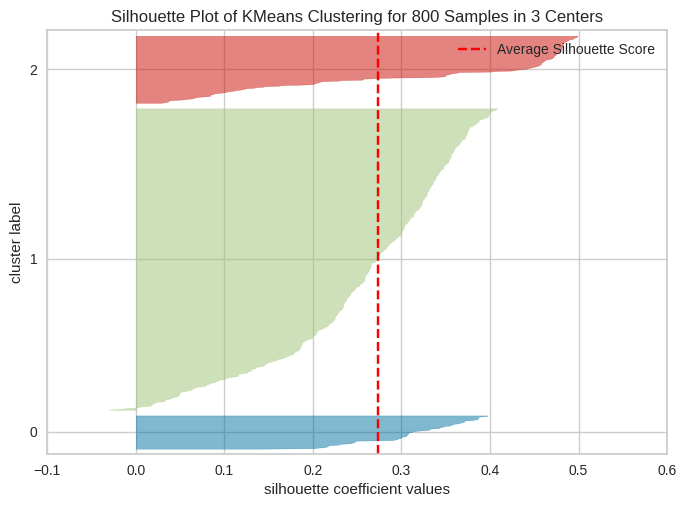

<Axes: title={'center': 'Silhouette Plot of KMeans Clustering for 800 Samples in 3 Centers'}, xlabel='silhouette coefficient values', ylabel='cluster label'>

In [ ]:
!pip install yellowbrick
from yellowbrick.cluster import SilhouetteVisualizer
from sklearn.cluster import KMeans

kmeans = KMeans(n_clusters=3,n_init='auto')
visualizer = SilhouetteVisualizer(kmeans, colors='yellowbrick')
visualizer.fit(df_scaled)
visualizer.show()



*   From the silhouette plot for clustering 800 samples into 3 centers using KMeans, the majority of samples have positive silhouette scores, supporting the notion that the clusters are well-formed.

*  However, similar to K=2, some samples in the second cluster have scores close to zero, indicating some overlap or ambiguity around cluster boundaries. There are also a few negative scores, suggesting that some samples may not be ideally clustered.



In [ ]:
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score
import pandas as pd

# Assuming X_scaled is your scaled data
X = df_scaled

# Perform k-means clustering with k=3
kmeans = KMeans(n_clusters=3, random_state=42, n_init='auto')
kmeans.fit(X_scaled)
labels = kmeans.labels_

# Compute the WSS (Within-Cluster Sum of Squares)
wss = kmeans.inertia_

# Compute the Average Silhouette Score
silhouette_avg = silhouette_score(X, labels)

# Print the evaluation metrics
print("WSS:", wss)
print("Average Silhouette Score:", silhouette_avg)

WSS: 4990.234072822593
Average Silhouette Score: 0.2142488093717586


#### Findings:

*   
WSS: 4990.23 - The lower WSS value compared to K=2 suggests improved cluster separation and compactness.

* Average Silhouette Score: 0.214 - The relatively low silhouette score indicates some overlap or ambiguity in the cluster assignments, showing that clusters may not be ideally distinct.



## **K=7**

In [ ]:
import numpy as np
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt

np.random.seed(8953)

# Perform K-means clustering for K=7
kmeans = KMeans(n_clusters=7, random_state=8953, n_init='auto')  # Set n_init explicitly
kmeans_result= kmeans.fit(df_scaled)

#Print the clustering result
print("Cluster Centers:")
print(kmeans_result.cluster_centers_)
print("\nCluster Labels:")
print(kmeans_result. labels_)

Cluster Centers:
[[-0.38172531  0.70524533  0.          3.30761221 -0.38277745 -0.25929162
  -0.04977674  0.80142128  0.31561301 -0.08996042]
 [ 0.8819171   0.19353041  0.         -0.3023329  -0.64492573 -0.1613826
   0.07630177 -0.50096692  0.06424175 -0.20975924]
 [-0.27321027 -1.81272896  0.         -0.3023329   1.55056613  2.12483873
  -0.08365273 -0.37361766 -1.28565224  1.20938414]
 [-1.13389342  0.33727719  0.         -0.3023329  -0.3114333  -0.30230392
  -1.00501256 -0.3649885   0.27237782 -0.4185406 ]
 [ 0.60249782 -0.24749508  0.         -0.3023329   1.55056613 -0.34198624
  -0.33173682 -0.40008765 -0.14755958  0.14664601]
 [-1.13389342  0.01093264  0.         -0.3023329  -0.15467027 -0.35826166
   0.99501244 -0.3509161   0.08740659  0.03557855]
 [-0.18733891  0.55390436  0.         -0.3023329  -0.60674327 -0.31925582
   0.02108722  1.81027748  0.53788086 -0.30798434]]

Cluster Labels:
[6 0 0 6 6 3 1 3 6 3 0 1 3 6 1 0 1 6 0 1 0 3 0 1 2 0 6 0 1 6 3 6 0 6 5 2 1
 6 6 1 3 6 6 1 6

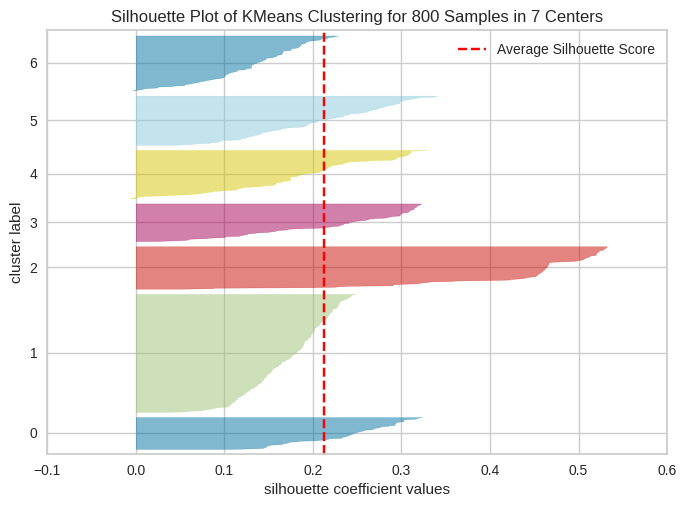

<Axes: title={'center': 'Silhouette Plot of KMeans Clustering for 800 Samples in 7 Centers'}, xlabel='silhouette coefficient values', ylabel='cluster label'>

In [ ]:
!pip install yellowbrick
from yellowbrick.cluster import SilhouetteVisualizer
from sklearn.cluster import KMeans

kmeans = KMeans(n_clusters=7,n_init='auto')
visualizer = SilhouetteVisualizer(kmeans, colors='yellowbrick')
visualizer.fit(df_scaled)
visualizer.show()



*  From the silhouette plot for clustering 800 samples into 7 centers using KMeans, the clustering shows a more refined separation among clusters, with most clusters exhibiting positive silhouette scores, indicating a higher quality of clustering compared to K=2 and K=3.

*   However, a few clusters still have scores close to zero, suggesting slight overlap at the edges of certain clusters. This larger number of clusters allows for a more granular analysis, potentially revealing unique subgroups within the data. The K=7 solution, with minimal negative silhouette scores, demonstrates improved cluster separation quality, making it a potentially optimal choice for detailed analysis.





In [ ]:
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score
import pandas as pd

# Assuming X_scaled is your scaled data
X = df_scaled

# Perform k-means clustering with k=6
kmeans = KMeans(n_clusters=7, random_state=42, n_init='auto')
kmeans.fit(X_scaled)
labels = kmeans.labels_

# Compute the WSS (Within-Cluster Sum of Squares)
wss = kmeans.inertia_

# Compute the Average Silhouette Score
silhouette_avg = silhouette_score(X, labels)

# Print the evaluation metrics
print("WSS:", wss)
print("Average Silhouette Score:", silhouette_avg)

WSS: 3365.380609397732
Average Silhouette Score: 0.20738200355748904


#### Findings:

* WSS: 3365.38 - The even lower WSS value indicates better separation and compactness of clusters compared to previous configurations.

*   
Average Silhouette Score: 0.207 - The lower silhouette score suggests some level of overlap or ambiguity between clusters, but the refined separation allows for more granular insights into the data.



## Evaluate the best models of Clustring:

|       | K=2 | K=3 | K=7 |
|--------------|---------------------------|---------------------------|---------------------------|
| **WSS**    | 5781.87                    |4990.23                   | 3365.38                    |
| **Average Silhouette Score** | 0.2499            |0.2142             | 0.2073                     |


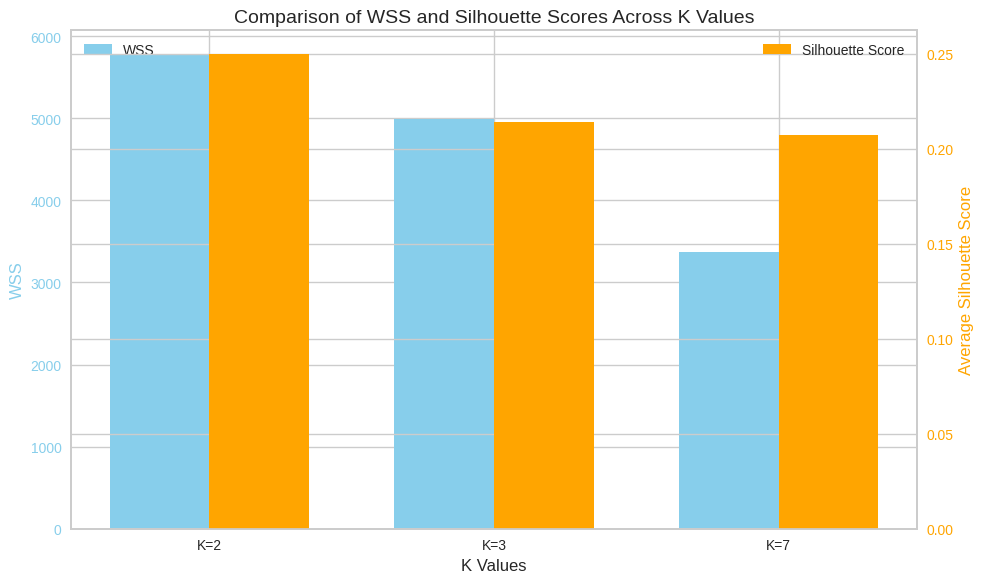

In [ ]:
# Data from the table
k_values = [2, 3, 7]
wss = [5781.87, 4990.23, 3365.38]
silhouette_scores = [0.2499, 0.2142, 0.2073]

# Grouped Bar Chart
x = np.arange(len(k_values))  # the label locations
width = 0.35  # the width of the bars

fig, ax1 = plt.subplots(figsize=(10, 6))

# Bars for WSS
bar1 = ax1.bar(x - width/2, wss, width, label='WSS', color='skyblue')
ax1.set_xlabel('K Values', fontsize=12)
ax1.set_ylabel('WSS', color='skyblue', fontsize=12)
ax1.tick_params(axis='y', labelcolor='skyblue')
ax1.set_xticks(x)
ax1.set_xticklabels([f'K={k}' for k in k_values])
ax1.legend(loc='upper left')

# Add a secondary y-axis for Silhouette Scores
ax2 = ax1.twinx()
bar2 = ax2.bar(x + width/2, silhouette_scores, width, label='Silhouette Score', color='orange')
ax2.set_ylabel('Average Silhouette Score', color='orange', fontsize=12)
ax2.tick_params(axis='y', labelcolor='orange')
ax2.legend(loc='upper right')

# Title and Layout
plt.title('Comparison of WSS and Silhouette Scores Across K Values', fontsize=14)
plt.tight_layout()

plt.tight_layout()
plt.show()

**In Summary**, K=2 is the best choice for our clustering model based on the metrics we’ve analyzed (WSS, Average Silhouette Score, Visualization of K-mean). This choice is because K=2 gives the highest silhouette width, and also K=2 has the highest value of WSS compared to the WSS values for K=3 and K=7.

Additionally, having a silhouette plot of K-Means clustering of 800 samples with 2 centers was one of the most important criteria for choosing K=2 as the best K, indicating that it creates distinct and cohesive clusters.

## **6.Evaluation and Comparison:**

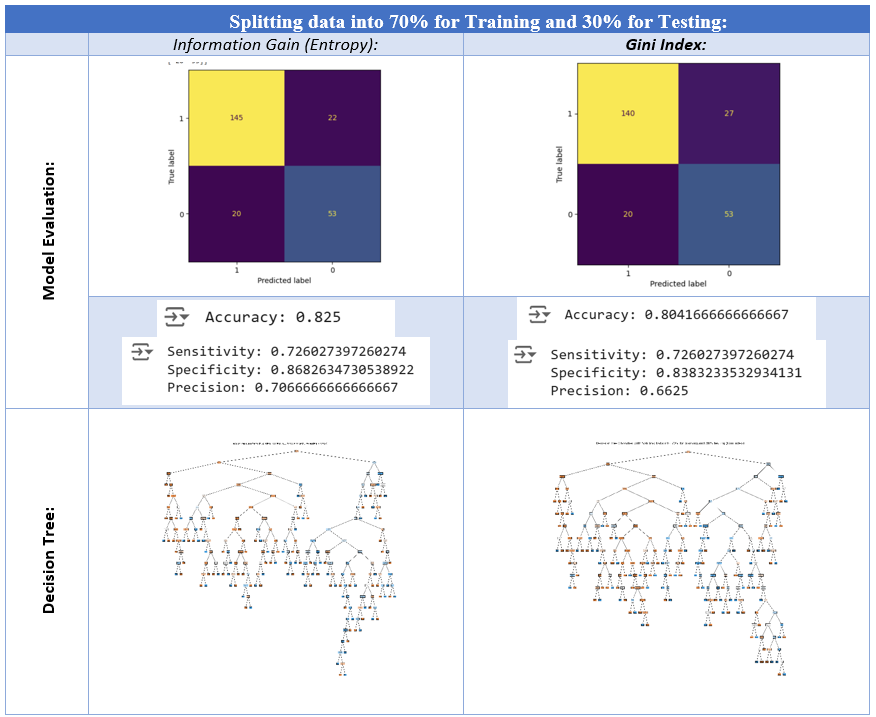

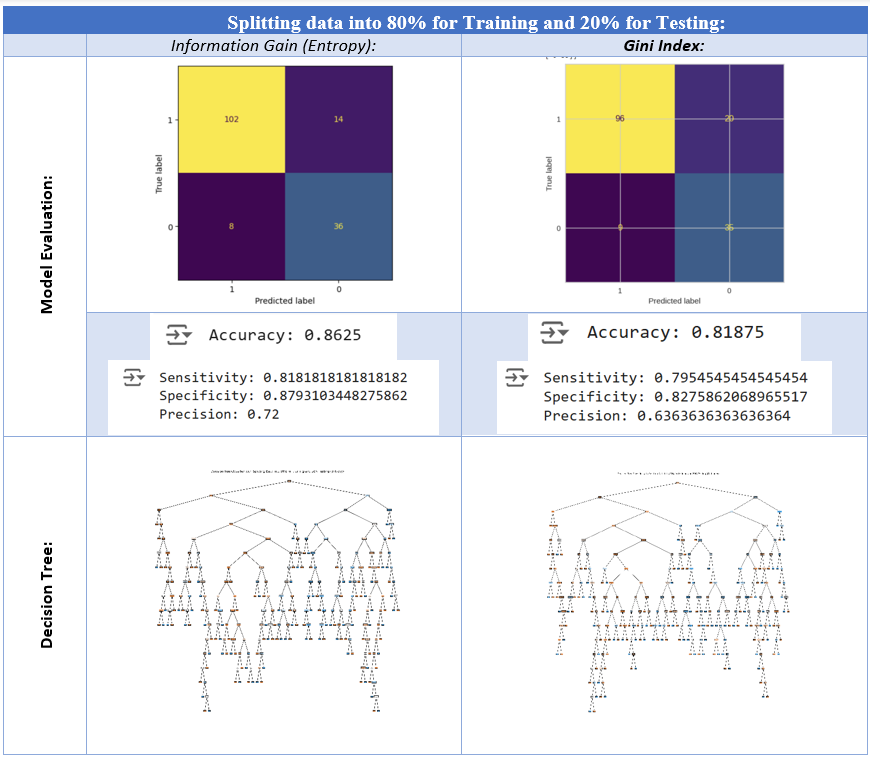

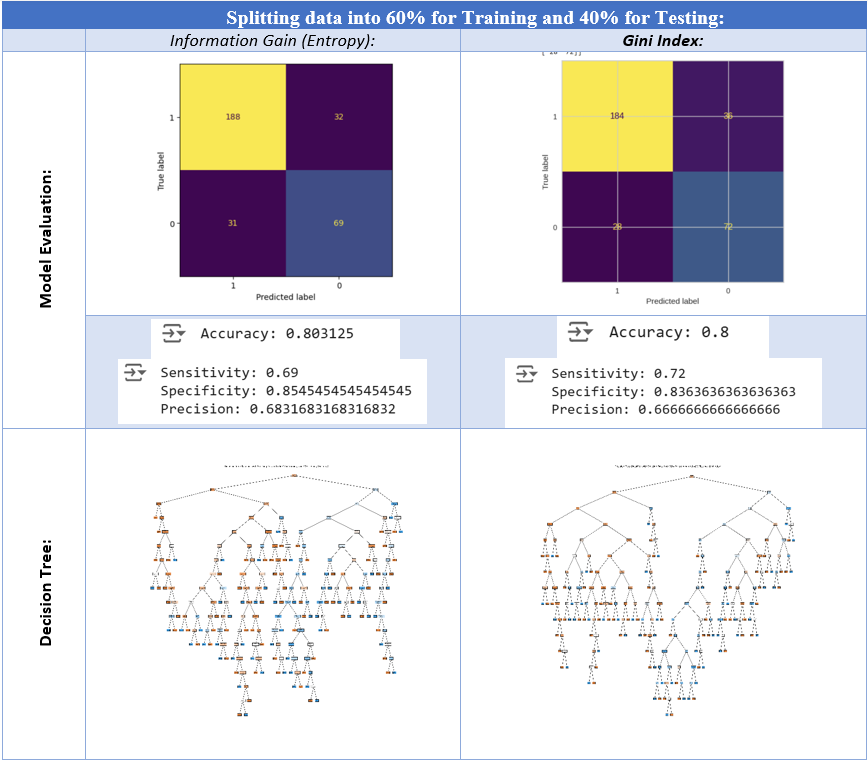

## Classification Evaluation:

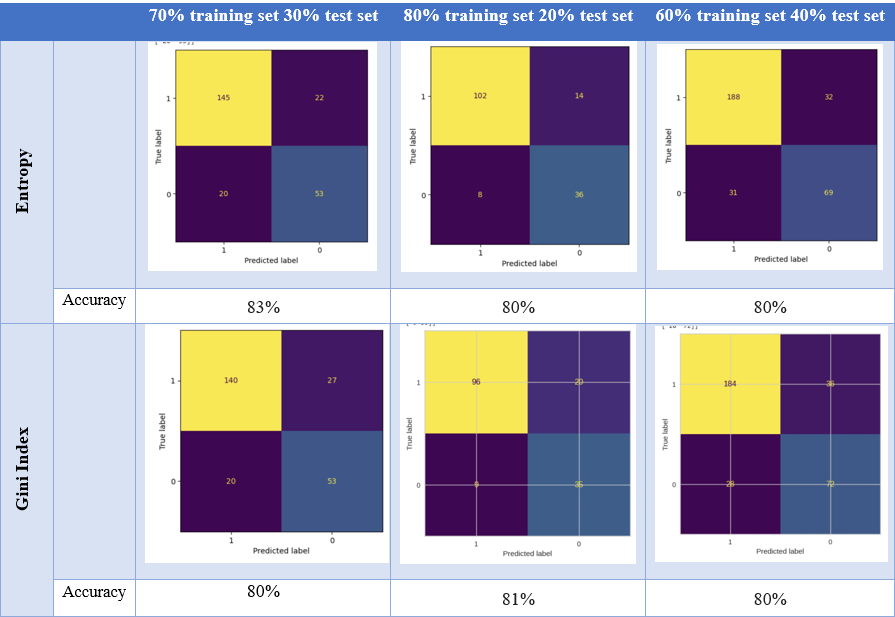

### Findings:

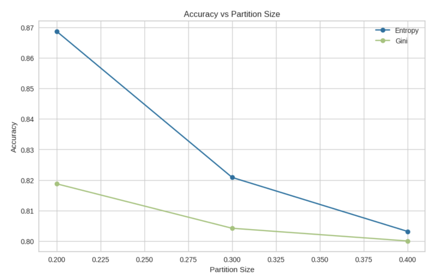

Information Gain (Entropy) is superior in overall accuracy, specificity, and precision, making it generally more effective across splits. Gini Index provides competitive sensitivity and precision in certain configurations but slightly trails in accuracy and specificity. If accuracy and specificity are the primary goals, Information Gain is preferable. However, Gini Index might be useful when focusing on sensitivity with a slightly larger training set.

## Clustering Evaluation:

#### Number of cluster chosen:

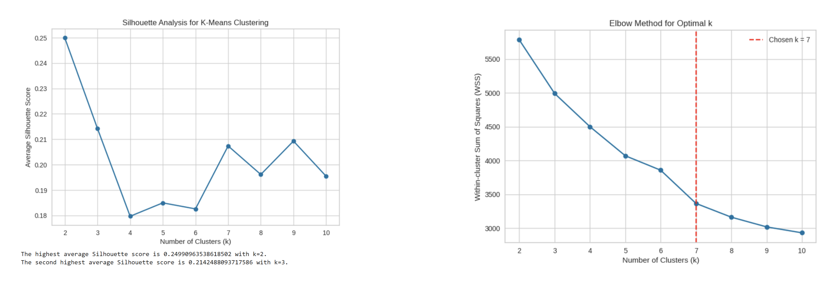

#### Cluster Figures:

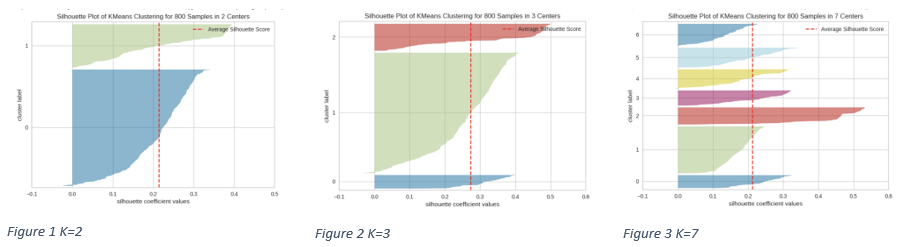

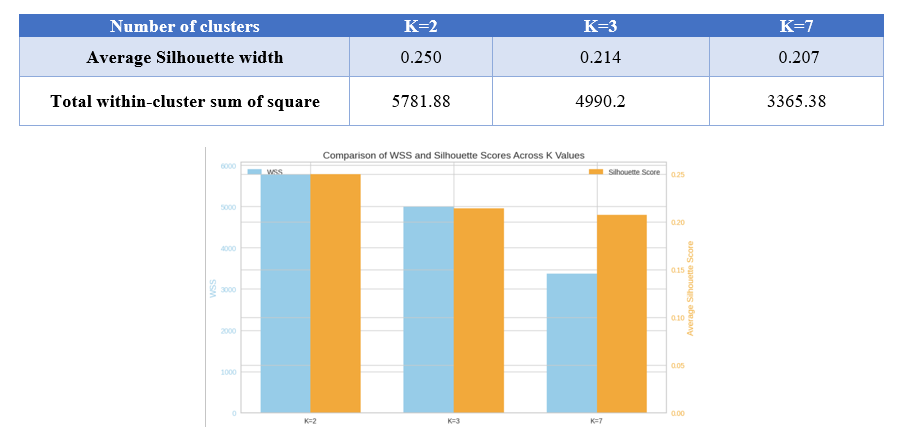

#### Findings:

K=2 is the best choice for our clustering model based on the metrics we’ve analyzed (WSS, Average Silhouette Score, Visualization of K-mean). This choice is because K=2 gives the highest silhouette width, and also K=2 has the highest value of WSS compared to the WSS values for K=3 and K=7.
Additionally, having a silhouette plot of K-Means clustering of 800 samples with 2 centers was one of the most important criteria for choosing K=2 as the best K, indicating that it creates distinct and cohesive clusters.


## **7.Findings:**
We begun with selecting the dataset under interest that meets our goal which was studying the cases of brain strokes.

To address the significant imbalance in our dataset, where stroke cases were significantly fewer than non-stroke cases, we employed a sampling technique to create a more balanced subset. This balanced subset aimed to include approximately 30% stroke cases and 70% non-stroke cases.

To gain insights into the data, we utilized various visualization techniques. Box plots were employed to identify outliers and understand data distribution. Scatter plots to visualize relationships between variables, such as the association between age and glucose levels. Histograms were used to visualize the distribution of numerical variables. Finally, heatmaps were employed to explore correlations between different features within the dataset.

Consequently, we began the data processing phase by smoothing outliers. However, as our dataset was already encoded, this step was not necessary. Additionally, we retained duplicate records as we lacked unique identifiers like patient ID or SIN to distinguish individual data duplications. Furthermore, we implemented data transformation, including normalization and discretization. Then we used the filter selection measure to quickly identify the top most important features that are strongly correlated with the occurrence of strokes.

We conducted data mining tasks, including classification and partitioning. For classification, we employed decision trees using the Gini index and information gain metrics. By experimenting with different training and testing set sizes, we optimized model construction and evaluation after comparing results.




•	Best Split for Information Gain: The 70% Training, 30% Testing split achieves the highest accuracy and stable specificity, offering a balanced trade-off.
•	Best Split for Gini Index: The 80% Training, 20% Testing split performs better and having the best sensitivity.

So, Information Gain yielded the highest percentage of all metrics, the highest accuracy when using the 70% Training 30% Testing split. This split also demonstrated strong performance in terms of specificity, while maintaining good sensitivity and precision. Figure (4) shows the decision tree for the best split.
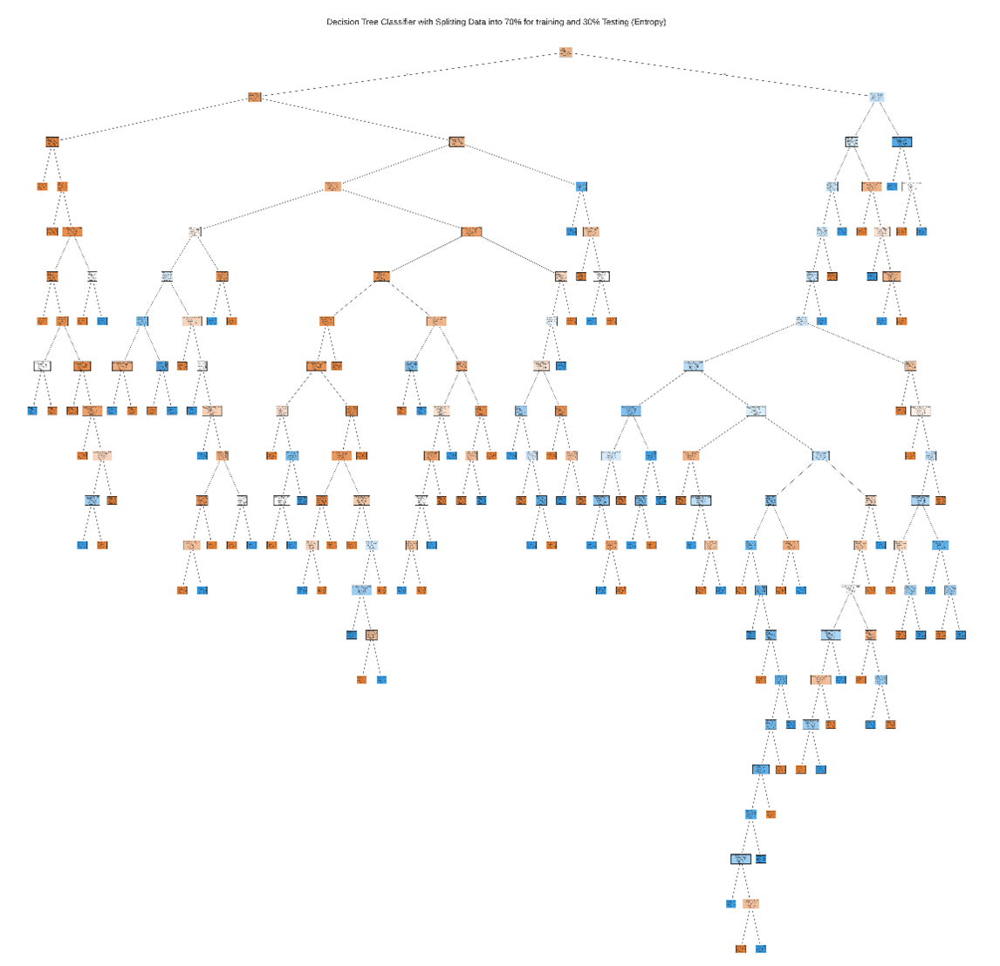

30/70 split decision tree structure
illustrates a decision tree model for classification, using Entropy as the splitting criterion. The dataset is split into 70% for training and 30% for testing. The tree begins with “age” as the root node, which plays a critical role in the initial classification.
In this tree, the condition on the age node is evaluated as follows: if age <= 15, the condition is false, and the model proceeds to check the next node, “ever married”. This node splits the data further based on marital status, directing individuals along different paths depending on whether they are married or not.
However, if age > 15, the condition on the age node is true. In this case, the model moves to the next decision node, “BMI”, where the classification is further refined based on the individual’s body mass index.
After these initial decisions, the model continues branching down, using additional features in a specific order to make further splits at each level. These nodes might include attributes such as average glucose level, hypertension status, heart disease, work type, residence type, and smoking status. Each node along the path serves as a decision checkpoint, progressively narrowing down the classification.
Each path from the root to a leaf node represents a unique sequence of decisions, leading to a specific classification outcome at the end. With multiple levels and branches, the tree captures data complexity by focusing on essential features at each split to create increasingly homogeneous groups in each branch. This structured decision-making process results in terminal nodes (leaves) that consistently represent the predicted class for each subset, offering insight into how various features influence the classification.
The Entropy-based tree is generally simpler than the Gini-based tree, with fewer branches, making it more streamlined and interpretable.





For clustering we used K-means algorithm with 3 different K to find the optinal number of clusters, then we calculated the average silhouette width for each K and total within-cluster sum of square:

  

According to results, we’ve decided that K=2 is the best choice for our clustering model based on the metrics we’ve analyzed (WSS, Average Silhouette Score, Visualization of K-mean). This choice is because K=2 gives the highest silhouette width, and also K=2 has the highest value of WSS compared to the WSS values for K=3 and K=7.
Additionally, having a silhouette plot of K-Means clustering of 800 samples with 2 centers was one of the most important criteria for choosing K=2 as the best K, indicating that it creates distinct and cohesive clusters.

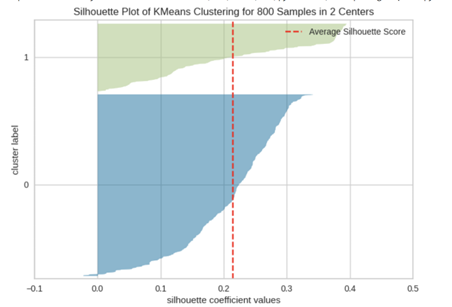



Silhouette plot for K=2
represents silhouette plot for clustering 800 samples into 2 centers using KMeans, most samples have positive silhouette scores, indicating that the samples are generally well-matched to their respective clusters and are reasonably distant from neighboring clusters.
However, Cluster 0 (blue region) has a broader range of silhouette coefficients, with many values close to 0 or even slightly negative. Negative values indicate samples that may be assigned to the wrong cluster, suggesting that some samples are closer to the neighboring cluster.
Cluster 1 (green region) has mostly positive silhouette coefficients, and samples in this cluster seem to be better clustered with relatively higher silhouette values.

**Finally**, both models are helpful for predicting whether a person can have a brain stroke, and helped us to reach our goal which is helping to have an impact on promoting public health. but since our data contains a class label “stroke” This makes Supervised Learning models(classification) more accurate and suitable to apply than unsupervised learning model(clustering), as the expected output is known beforehand this way we makes use of the class label attribute.


## **8.References:**

1.	N. K. Niranjanan, “Brain Stroke Data dataset,” Kaggle, [Online]. Available: https://www.kaggle.com/datasets/niranjanank/brain-stroke-data

2. College of Computer Science, Department of Information Technology, King Saud University, “Labs and Lecture Slides,” [Online]. Available: https://lms.ksu.edu.sa/

3. J. Han, J. Pei, and H. Tong, Data Mining: Concepts and Techniques, 4th ed., Morgan Kaufmann, 2022